In [1]:
import sys
import os
import uproot
import numpy as np
import matplotlib.pyplot as plt

from scipy import stats as st
import scipy

import peakutils

from datetime import datetime

import math
from scipy          import stats
from scipy.optimize import curve_fit

In [2]:
### Import functions from peak_functions

repository_path = os.path.abspath('../..')
sys.path.append(repository_path)

import blr_functions  as blr
import peak_functions as pf
import fit_functions  as fitf

In [3]:
import warnings
warnings.filterwarnings("ignore")

In [4]:
plt.rcParams["figure.figsize"] = 9, 6
plt.rcParams["font.size"]      = 14

In [5]:
filename = '/Users/romoluque_c/LEGEND/BACON/datatest/run-11_20_2023-file_1.root'
infile   = uproot.open(filename)
RawTree  = infile['RawTree']

### Plot one event

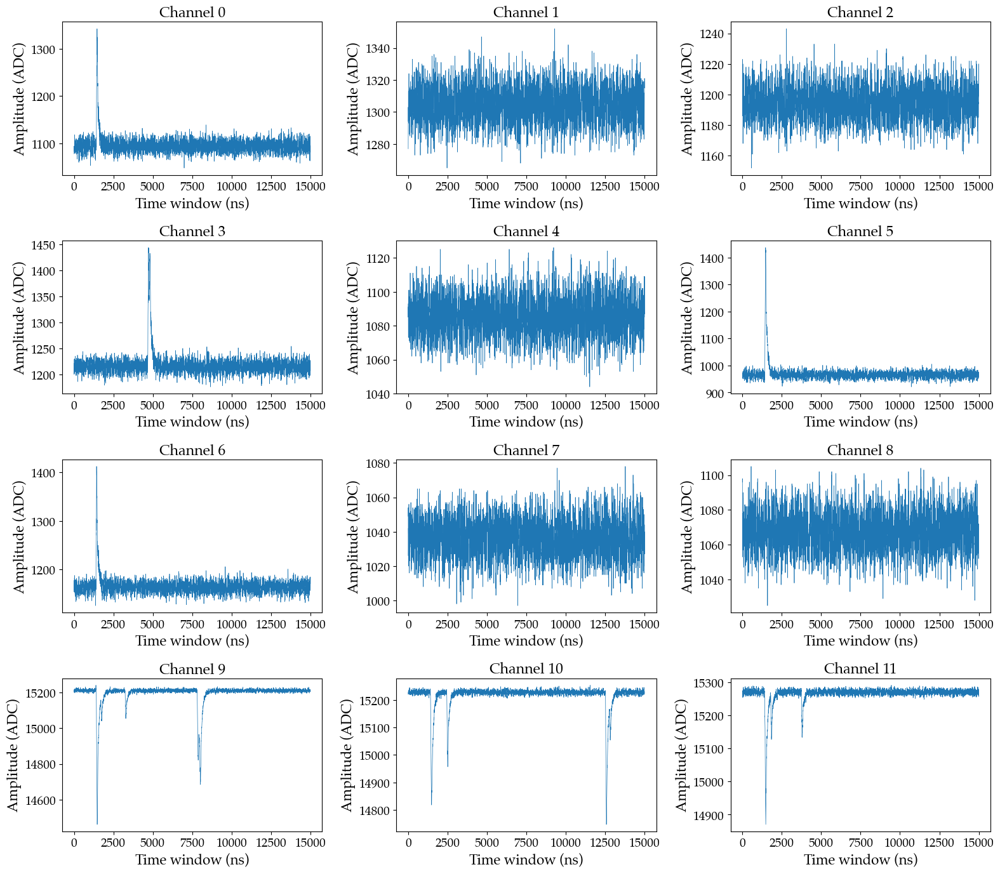

In [67]:
choose_evt = 4
fig, axs = plt.subplots(4, 3, figsize=(16, 14))
for k in range(12):
    #if k==3: continue
    i = int(k/3)
    j = k%3
    wf = np.array(RawTree[f'chan{k}/rdigi'].array())[choose_evt]
    axs[i][j].plot(2*np.arange(len(wf)), wf, linewidth=0.5)
    axs[i][j].set_xlabel('Time window (ns)', fontsize=16)
    axs[i][j].set_ylabel('Amplitude (ADC)', fontsize=16)
    axs[i][j].set_title(f"Channel {k}")
plt.tight_layout()
plt.show()

In [550]:
fav_col = '#418094'

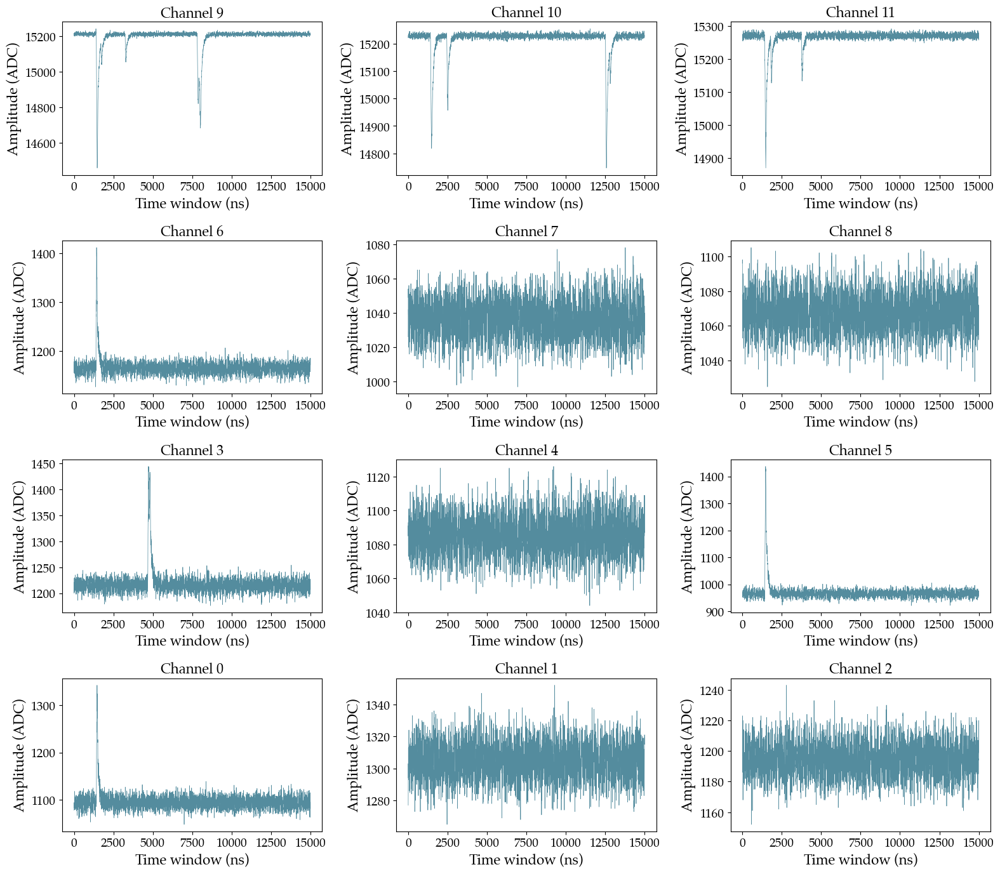

In [608]:
choose_evt = 4
fig, axs   = plt.subplots(4, 3, figsize=(16, 14))
for row, ich in enumerate(reversed(np.arange(0, 12, 3))):
    for col in range(3):
        ch = ich + col
        wf = np.array(RawTree[f'chan{ch}/rdigi'].array())[choose_evt]
        axs[row][col].plot(2*np.arange(len(wf)), wf, linewidth=0.5, color=fav_col, alpha=0.9)
        axs[row][col].set_xlabel('Time window (ns)', fontsize=16)
        axs[row][col].set_ylabel('Amplitude (ADC)',  fontsize=16)
        axs[row][col].set_title(f"Channel {ch}",     fontsize=16)
plt.tight_layout()
#plt.savefig('/Users/romoluque_c/LEGEND/BACON/Analysis_documentation/images/event_example_all_SiPMs.pdf', bbox_inches='tight')
plt.show()

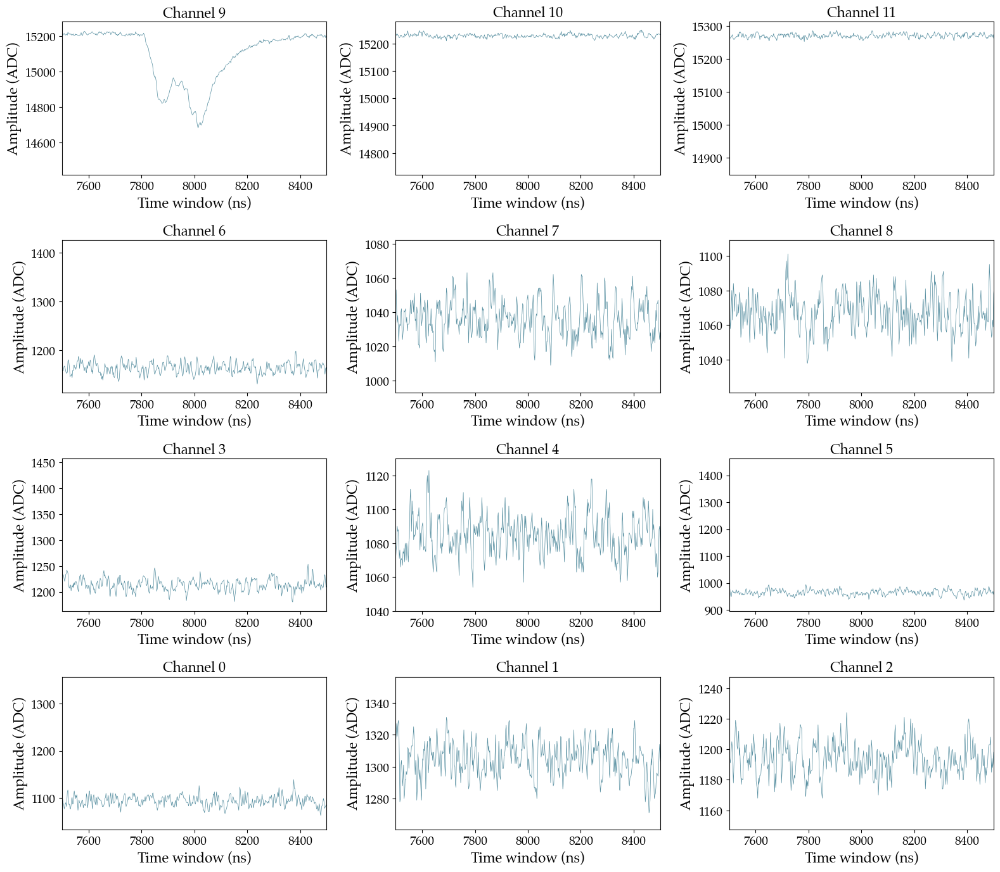

In [656]:
choose_evt = 4
fig, axs   = plt.subplots(4, 3, figsize=(16, 14))
for row, ich in enumerate(reversed(np.arange(0, 12, 3))):
    for col in range(3):
        ch = ich + col
        wf = np.array(RawTree[f'chan{ch}/rdigi'].array())[choose_evt]
        axs[row][col].plot(2*np.arange(len(wf)), wf, linewidth=0.5, color=fav_col, alpha=0.9)
        axs[row][col].set_xlabel('Time window (ns)', fontsize=16)
        axs[row][col].set_ylabel('Amplitude (ADC)',  fontsize=16)
        axs[row][col].set_title(f"Channel {ch}",     fontsize=16)
        axs[row][col].set_xlim(7500, 8500)
plt.tight_layout()
#plt.savefig('/Users/romoluque_c/LEGEND/BACON/Analysis_documentation/images/event_example_all_SiPMs.pdf', bbox_inches='tight')
plt.show()

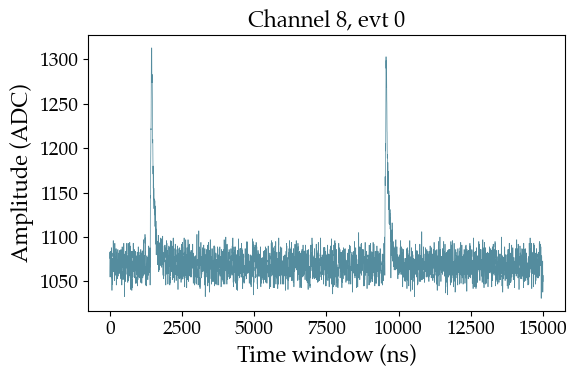

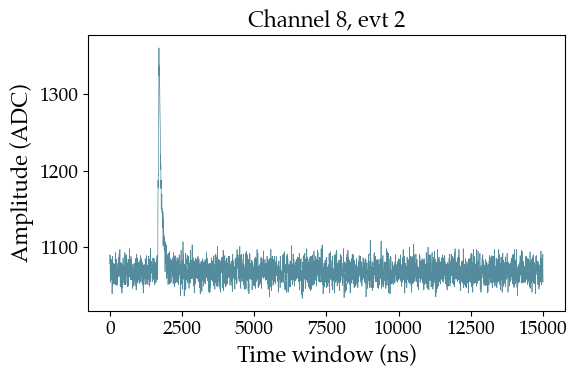

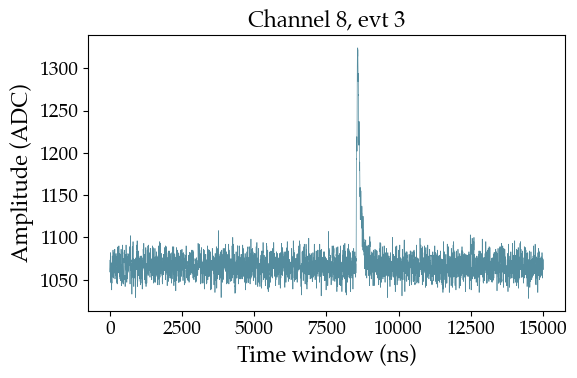

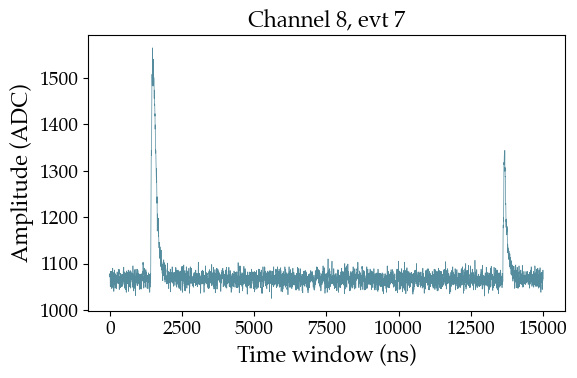

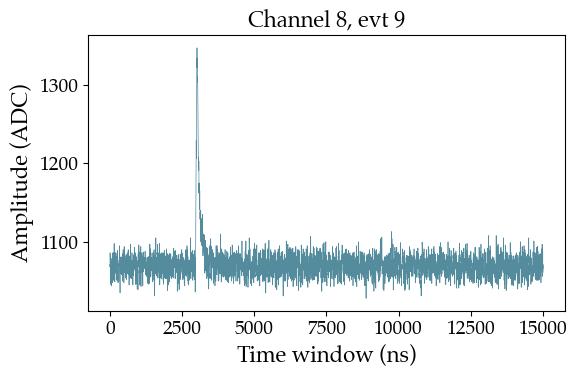

...

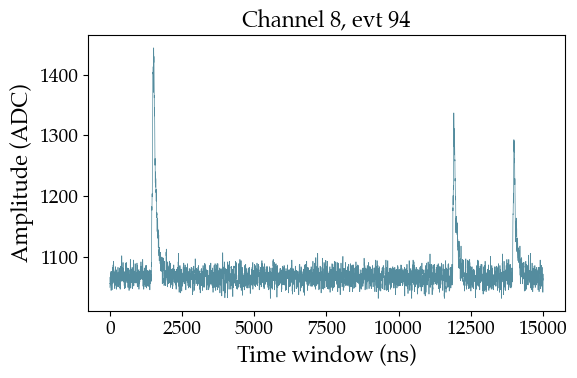

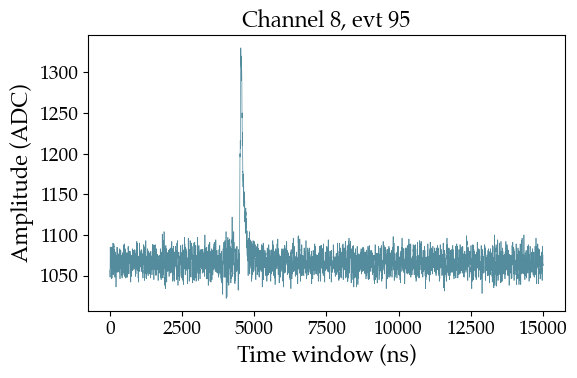

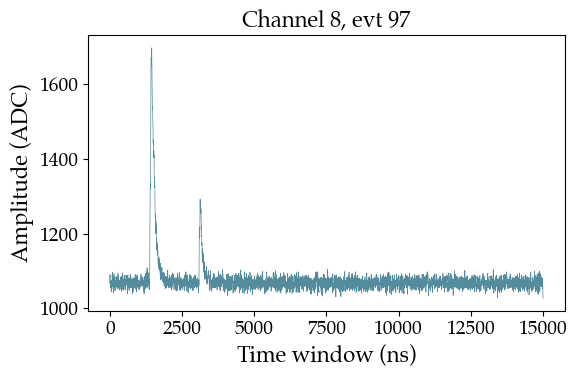

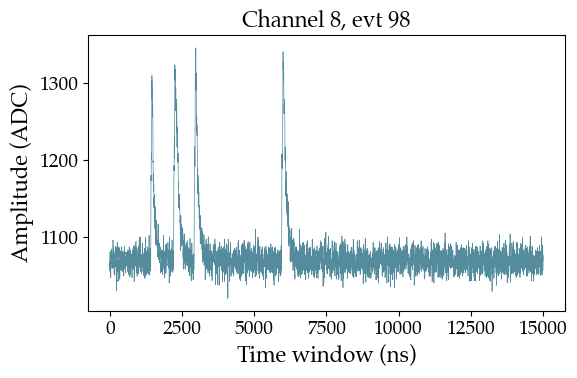

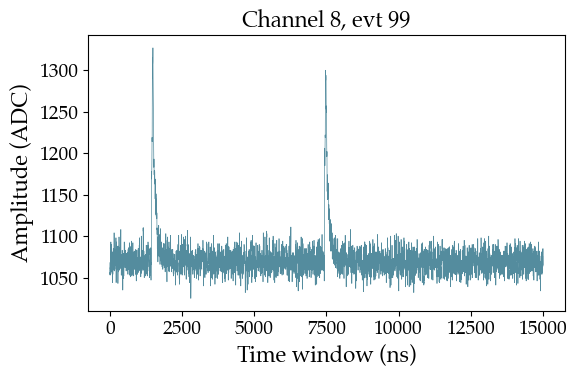

In [107]:
sel_ch     = 8
all_wfs_ch = np.array(RawTree[f'chan{sel_ch}/rdigi'].array())
for evt, wf in enumerate(all_wfs_ch[:100]):
    #if evt in [0, 12, 18, 25]:
    if np.std(wf)>20:
        plt.figure(figsize=(6, 4))
        plt.plot(2*np.arange(len(wf)), wf, linewidth=0.5, color=fav_col, alpha=0.9)
        plt.xlabel('Time window (ns)', fontsize=16)
        plt.ylabel('Amplitude (ADC)',  fontsize=16)
        plt.title(f"Channel {sel_ch}, evt {evt}",     fontsize=16)
        plt.tight_layout()
        #plt.savefig('/Users/romoluque_c/LEGEND/BACON/Analysis_documentation/images/event_example_all_SiPMs.pdf', bbox_inches='tight')
        plt.show()

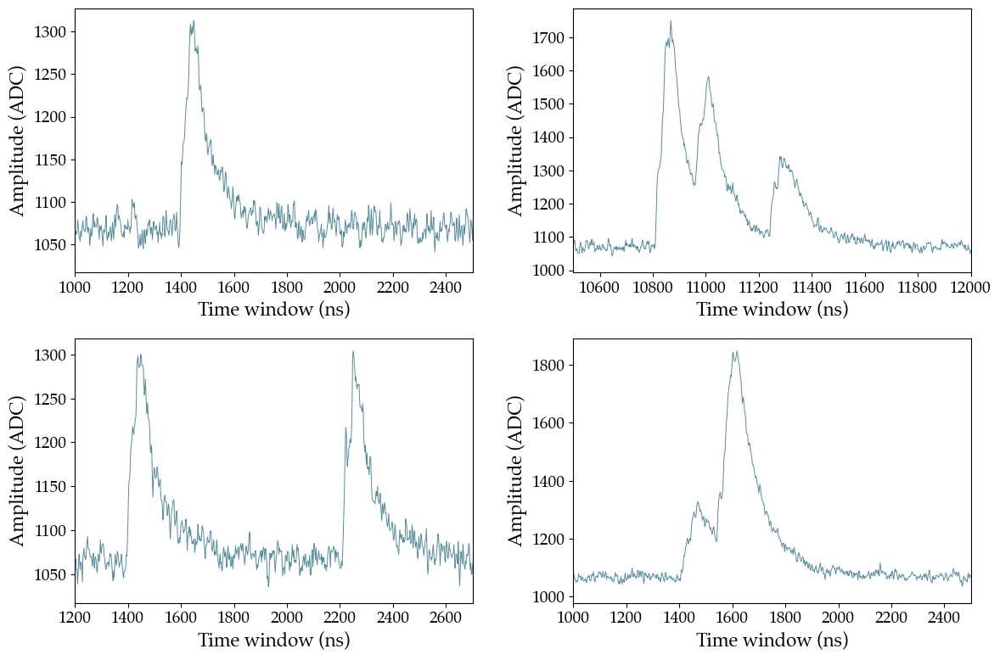

In [116]:
sel_ch     = 8
all_wfs_ch = np.array(RawTree[f'chan{sel_ch}/rdigi'].array())
fig, axs = plt.subplots(2, 2, figsize=(12, 8))
for evt, ax, xlim in zip([0, 37, 18, 56], axs.flatten(), [(1000, 2500), (10500, 12000), (1200, 2700), (1000, 2500)]):
    #if np.std(wf)>20:
    ax.plot(2*np.arange(len(all_wfs_ch[evt])), all_wfs_ch[evt], linewidth=0.7, color=fav_col, alpha=0.9)
    ax.set_xlim(xlim)
    ax.set_xlabel('Time window (ns)', fontsize=16)
    ax.set_ylabel('Amplitude (ADC)',  fontsize=16)
plt.tight_layout()
#plt.savefig(f'/Users/romoluque_c/LEGEND/BACON/Analysis_documentation/images/4event_example_channel{sel_ch}.pdf', bbox_inches='tight')
plt.show()

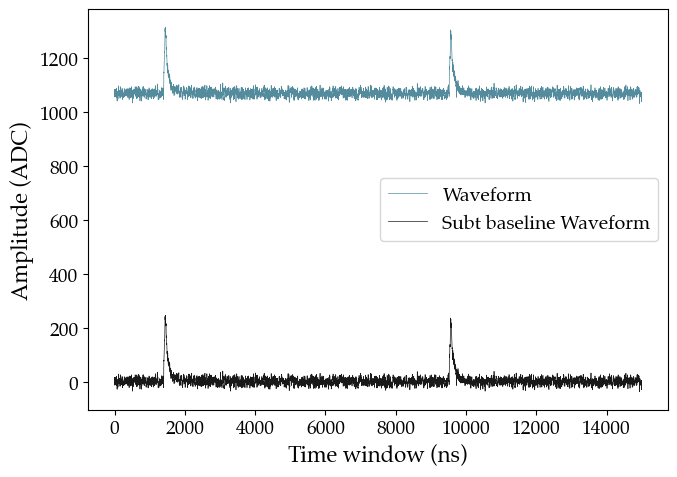

In [119]:
sel_ch     = 8
one_wf_ch  = np.array(RawTree[f'chan{sel_ch}/rdigi'].array())[0]
subt_wf_ch = pf.subtract_baseline(one_wf_ch, mode=True, wf_range_bsl=(0, 650))

plt.figure(figsize=(7, 5))
plt.plot(2*np.arange(len(one_wf_ch)),  one_wf_ch,  linewidth=0.5, color=fav_col, alpha=0.9, label='Waveform')
plt.plot(2*np.arange(len(subt_wf_ch)), subt_wf_ch, linewidth=0.5, color='k',     alpha=0.9, label='Subt baseline Waveform')
plt.xlabel('Time window (ns)', fontsize=16)
plt.ylabel('Amplitude (ADC)',  fontsize=16)
plt.legend()
plt.tight_layout()
#plt.savefig('/Users/romoluque_c/LEGEND/BACON/Analysis_documentation/images/event_example_all_SiPMs.pdf', bbox_inches='tight')
plt.show()

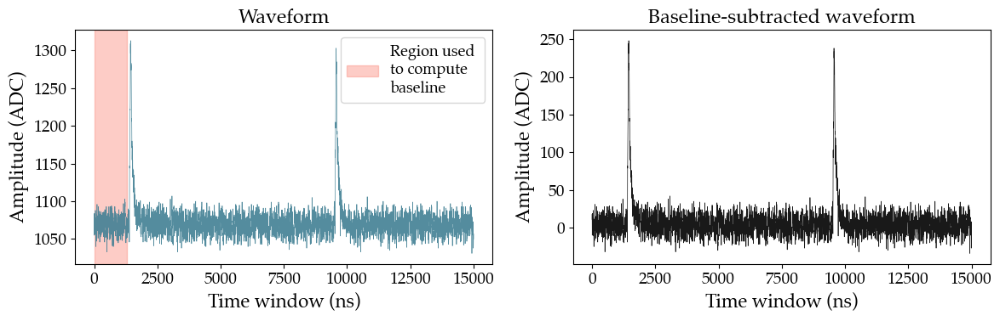

In [153]:
sel_ch      = 8
one_wf_ch   = np.array(RawTree[f'chan{sel_ch}/rdigi'].array())[0]
subt_wf_ch0 = pf.subtract_baseline(one_wf_ch, mode=True,  wf_range_bsl=(0, 650))
subt_wf_ch1 = pf.subtract_baseline(one_wf_ch, mode=False, wf_range_bsl=(0, 650))
fig, axs = plt.subplots(1, 2, figsize=(12, 4))
for i, (ax,wf,col,lab) in enumerate(zip(axs,[one_wf_ch,subt_wf_ch],[fav_col,'k'],['Waveform','Baseline-subtracted waveform'])):
    ax.plot(2*np.arange(len(wf)),  wf,  linewidth=0.5, color=col, alpha=0.9)
    if i==0:
        ax.axvspan(0, 1300, color='salmon', alpha=0.4, label='Region used \nto compute \nbaseline')
        ax.legend(fontsize=13)
    ax.set_xlabel('Time window (ns)', fontsize=16)
    ax.set_ylabel('Amplitude (ADC)',  fontsize=16)
    ax.set_title(lab)
plt.tight_layout()
#plt.savefig('/Users/romoluque_c/LEGEND/BACON/Analysis_documentation/images/Baseline_subtraction_data.pdf', bbox_inches='tight')
plt.show()

In [132]:
wfs_ch       = np.array(RawTree[f'chan{sel_ch}/rdigi'].array())
subt_wfs_ch0 = pf.subtract_baseline(wfs_ch, mode=True,  wf_range_bsl=(0, 650))
subt_wfs_ch1 = pf.subtract_baseline(wfs_ch, mode=False, wf_range_bsl=(0, 650))

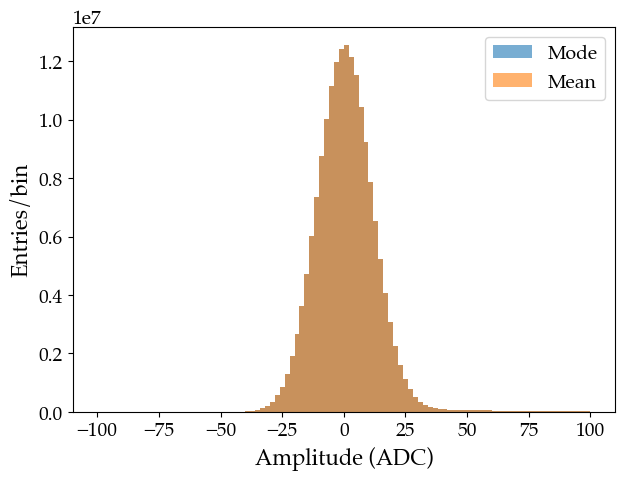

In [140]:
plt.figure(figsize=(7, 5))
plt.hist(subt_wfs_ch0.flatten(), bins=100, range=(-100, 100), alpha=0.6, label='Mode')
plt.hist(subt_wfs_ch1.flatten(), bins=100, range=(-100, 100), alpha=0.6, label='Mean')
plt.xlabel('Amplitude (ADC)', fontsize=16)
plt.ylabel('Entries/bin',     fontsize=16)
plt.legend()
plt.show()

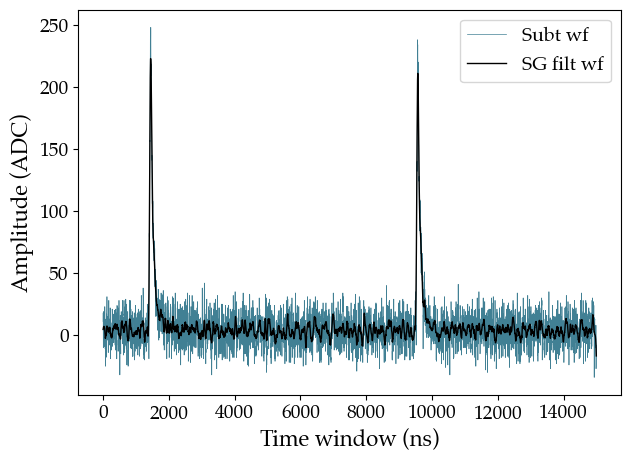

In [509]:
from scipy.signal import savgol_filter

sel_ch      = 8
one_wf_ch   = np.array(RawTree[f'chan{sel_ch}/rdigi'].array())[0]
subt_wf_ch  = pf.subtract_baseline(one_wf_ch, mode=True, wf_range_bsl=(0, 650))
filt_swf_ch = savgol_filter(subt_wf_ch, window_length=50, polyorder=3)

plt.figure(figsize=(7, 5))
plt.plot(2*np.arange(len(subt_wf_ch)), subt_wf_ch,   linewidth=0.5, color=fav_col, label='Subt wf')
plt.plot(2*np.arange(len(filt_swf_ch)), filt_swf_ch, linewidth=1,   color='k',     label='SG filt wf')
plt.xlabel('Time window (ns)', fontsize=16)
plt.ylabel('Amplitude (ADC)',  fontsize=16)
plt.legend()
#plt.savefig('/Users/romoluque_c/LEGEND/BACON/Analysis_documentation/images/SG_waveform.pdf', bbox_inches='tight')
plt.show()

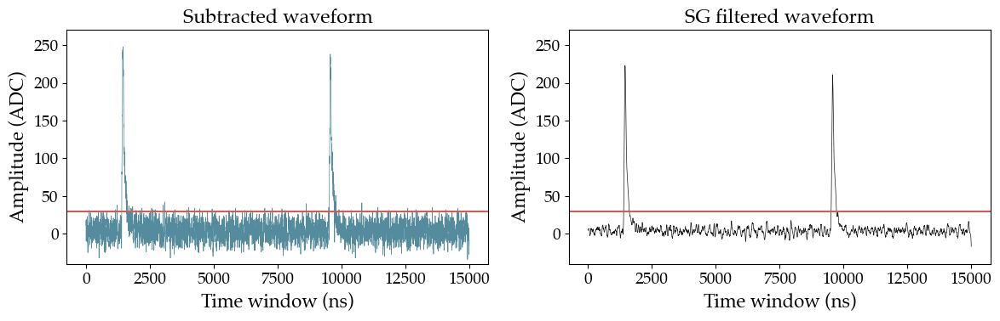

In [511]:
sel_ch      = 8
sel_thr     = 30 #ADC
one_wf_ch   = np.array(RawTree[f'chan{sel_ch}/rdigi'].array())[0]
subt_wf_ch  = pf.subtract_baseline(one_wf_ch, mode=True, wf_range_bsl=(0, 650))
filt_swf_ch = savgol_filter(subt_wf_ch, window_length=50, polyorder=3)

fig, axs = plt.subplots(1, 2, figsize=(12, 4))
for i, (ax,wf,col,lab) in enumerate(zip(axs,[subt_wf_ch,filt_swf_ch],[fav_col,'k'],['Subtracted waveform', 'SG filtered waveform'])):
    ax.plot(2*np.arange(len(wf)),  wf,  linewidth=0.5, color=col, alpha=0.9)
    ax.axhline(y=30, color='indianred')
    ax.set_xlabel('Time window (ns)', fontsize=16)
    ax.set_ylabel('Amplitude (ADC)',  fontsize=16)
    ax.set_title(lab)
    ax.set_ylim(-40, 270)
plt.tight_layout()
#plt.savefig('/Users/romoluque_c/LEGEND/BACON/Analysis_documentation/images/SG_waveform_thr.pdf', bbox_inches='tight')
plt.show()

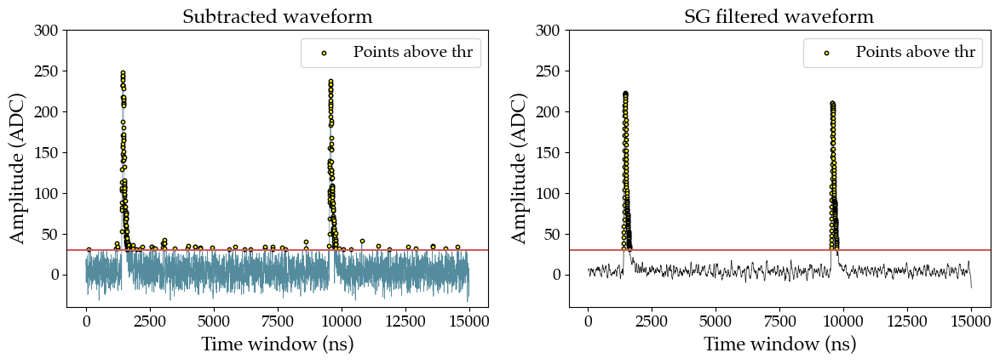

In [513]:
sel_ch      = 8
one_wf_ch   = np.array(RawTree[f'chan{sel_ch}/rdigi'].array())[0]
subt_wf_ch  = pf.subtract_baseline(one_wf_ch, mode=True, wf_range_bsl=(0, 650))
filt_swf_ch = savgol_filter(subt_wf_ch, window_length=50, polyorder=3)

fig, axs = plt.subplots(1, 2, figsize=(12, 4.5))
for i, (ax,wf,col,lab) in enumerate(zip(axs,[subt_wf_ch,filt_swf_ch],[fav_col,'k'],['Subtracted waveform', 'SG filtered waveform'])):
    
    ax.plot(2*np.arange(len(wf)),  wf,  linewidth=0.5, color=col, alpha=0.9)

    idx_ab_thr = np.where(wf>sel_thr)[0]
    ax.scatter(2*idx_ab_thr, wf[idx_ab_thr], color='yellow', edgecolors='black', marker='o', s=10, zorder=2, label=f'Points above thr')

    ax.axhline(y=30, color='indianred')
    ax.set_xlabel('Time window (ns)', fontsize=16)
    ax.set_ylabel('Amplitude (ADC)',  fontsize=16)
    ax.set_title(lab)
    ax.set_ylim(-40, 300)
    ax.legend()
plt.tight_layout()
#plt.savefig('/Users/romoluque_c/LEGEND/BACON/Analysis_documentation/images/SG_waveform_thr_points.pdf', bbox_inches='tight')
plt.show()

#### Find a waveform with peaks before the trigger region:

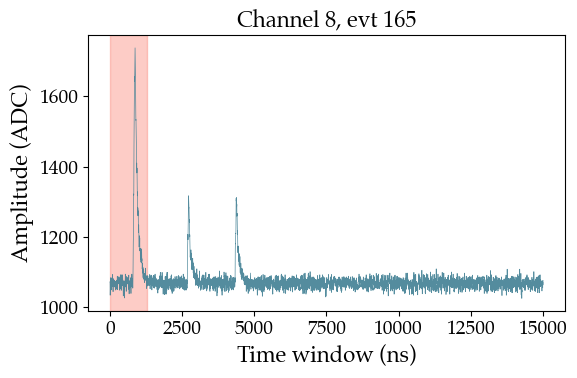

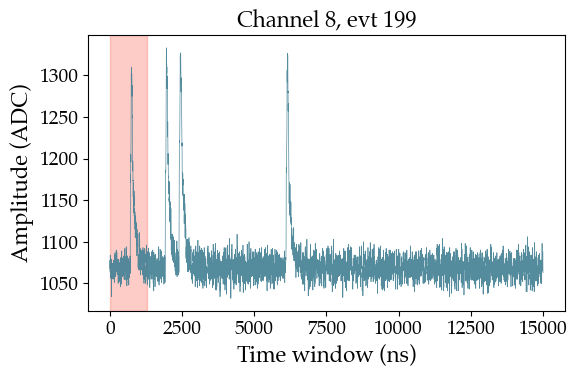

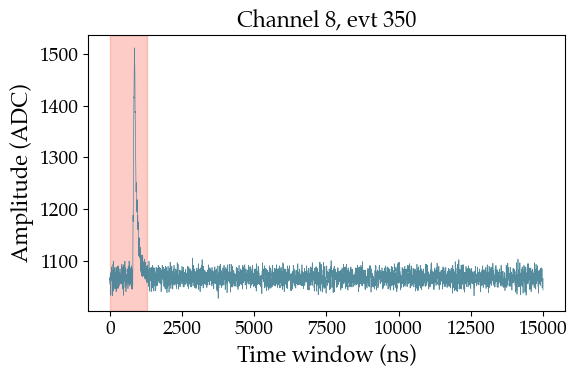

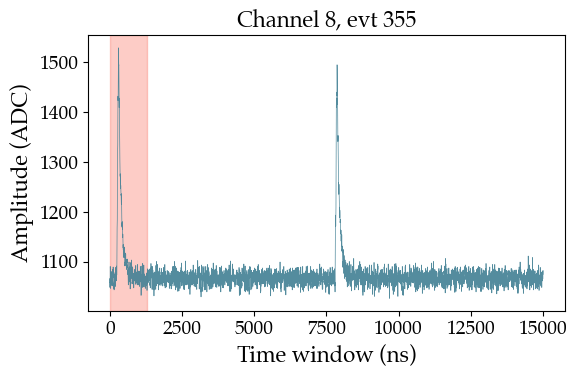

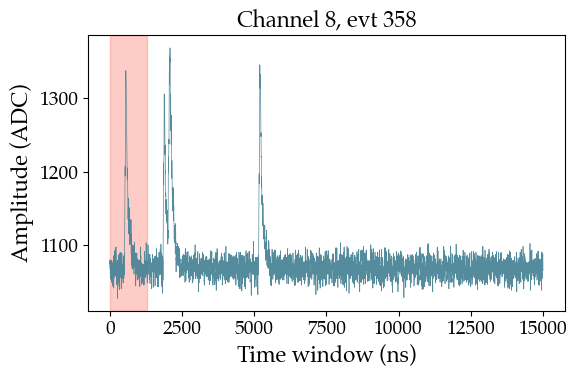

...

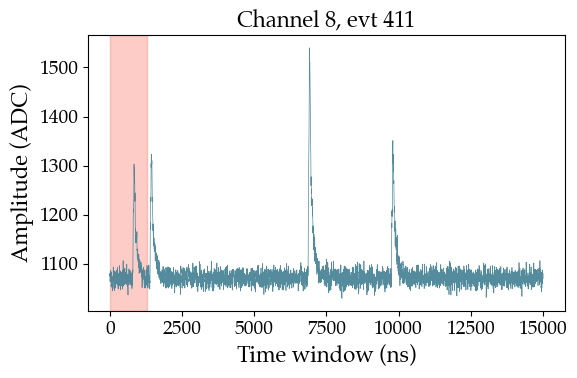

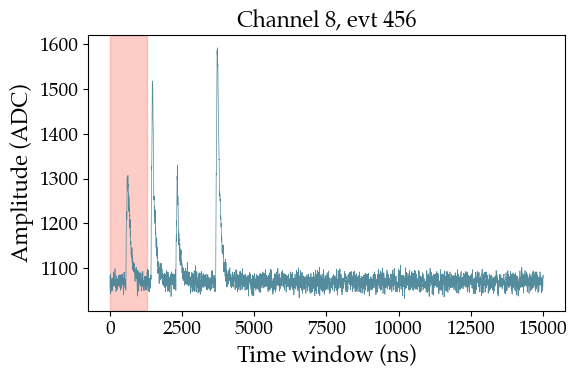

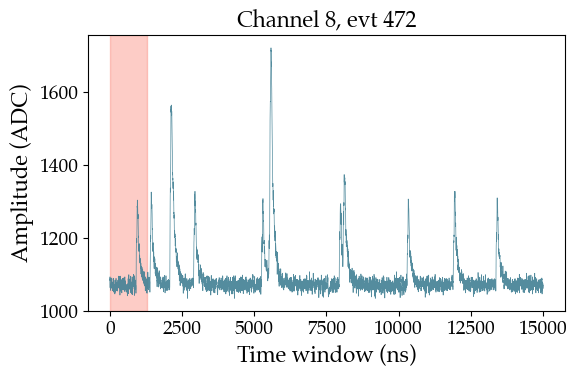

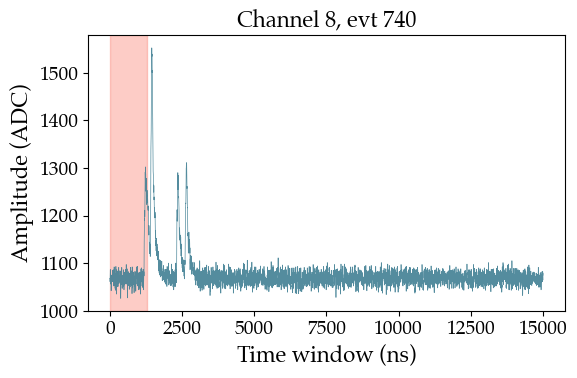

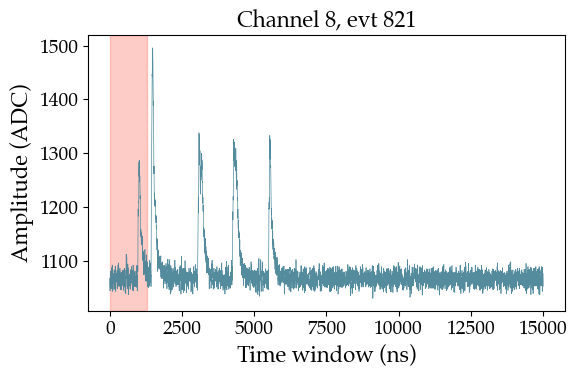

In [205]:
sel_ch       = 8
wf_range_bsl = 650
all_wfs_ch   = np.array(RawTree[f'chan{sel_ch}/rdigi'].array())
for evt, wf in enumerate(all_wfs_ch[:1000]):
    #if evt in [0, 12, 18, 25]:
    if np.std(wf[:wf_range_bsl])>20:
        plt.figure(figsize=(6, 4))
        plt.plot(2*np.arange(len(wf)), wf, linewidth=0.5, color=fav_col, alpha=0.9)
        plt.axvspan(0, 1300, color='salmon', alpha=0.4, label='Region used \nto compute \nbaseline')
        plt.xlabel('Time window (ns)', fontsize=16)
        plt.ylabel('Amplitude (ADC)',  fontsize=16)
        plt.title(f"Channel {sel_ch}, evt {evt}",     fontsize=16)
        plt.tight_layout()
        #plt.savefig('/Users/romoluque_c/LEGEND/BACON/Analysis_documentation/images/event_example_all_SiPMs.pdf', bbox_inches='tight')
        plt.show()

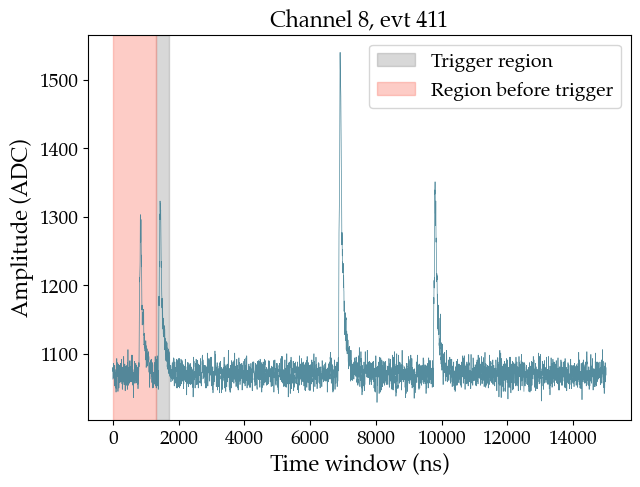

In [210]:
sel_ch       = 8
wf_range_bsl = 650
all_wfs_ch   = np.array(RawTree[f'chan{sel_ch}/rdigi'].array())
for evt, wf in enumerate(all_wfs_ch[:1000]):
    if evt in [411]:
        #if np.std(wf[:wf_range_bsl])>20:
        plt.figure(figsize=(7, 5))
        plt.plot(2*np.arange(len(wf)), wf, linewidth=0.5, color=fav_col, alpha=0.9)
        plt.axvspan(1300, 1700, color='grey',   alpha=0.3, label='Trigger region')
        plt.axvspan(   0, 1300, color='salmon', alpha=0.4, label='Region before trigger')
        plt.xlabel('Time window (ns)', fontsize=16)
        plt.ylabel('Amplitude (ADC)',  fontsize=16)
        plt.title(f"Channel {sel_ch}, evt {evt}",     fontsize=16)
        plt.legend()
        #plt.savefig('/Users/romoluque_c/LEGEND/BACON/Analysis_documentation/images/event_example_all_SiPMs.pdf', bbox_inches='tight')
        plt.show()

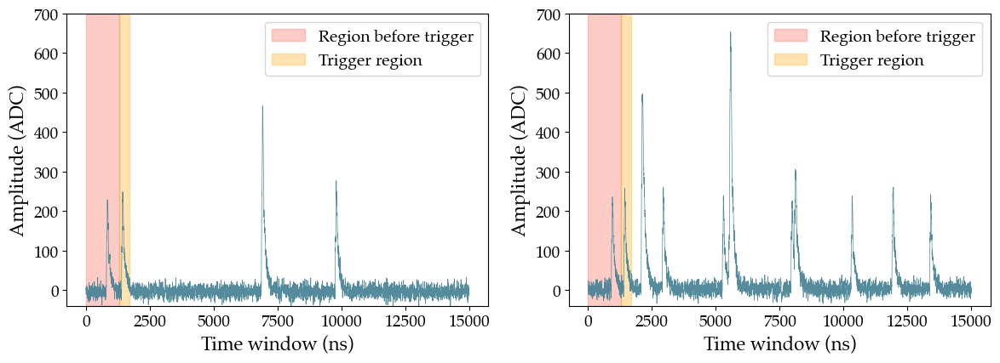

In [338]:
sel_ch       = 8
wf_range_bsl = 650
fig, axs     = plt.subplots(1, 2, figsize=(12, 4.5))
for i, (ax,evt) in enumerate(zip(axs,[411,472])):
    wf  = np.array(RawTree[f'chan{sel_ch}/rdigi'].array())[evt]
    swf = pf.subtract_baseline(wf, mode=True, wf_range_bsl=(0, wf_range_bsl))
    ax.plot(2*np.arange(len(swf)), swf, linewidth=0.5, color=fav_col, alpha=0.9)
    ax.axvspan(   0, 1300, color='salmon', alpha=0.4, label='Region before trigger')
    ax.axvspan(1300, 1700, color='orange', alpha=0.3, label='Trigger region')
    ax.set_xlabel('Time window (ns)', fontsize=16)
    ax.set_ylabel('Amplitude (ADC)',  fontsize=16)
    ax.set_ylim(-40, 700)
    ax.legend()
plt.tight_layout()
#plt.savefig('/Users/romoluque_c/LEGEND/BACON/Analysis_documentation/images/Two_evts_with_signal_before_trigger_ch8.pdf', bbox_inches='tight')
plt.show()

#### Zero suppressed waveform

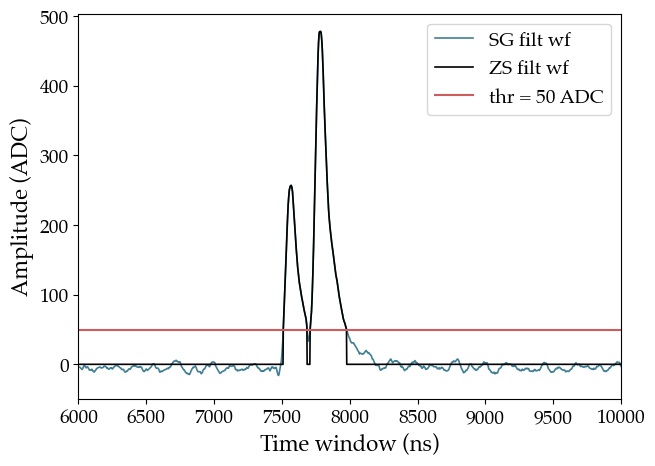

In [271]:
sel_ch      = 8
one_wf_ch   = np.array(RawTree[f'chan{sel_ch}/rdigi'].array())[12]
subt_wf_ch  = pf.subtract_baseline(one_wf_ch, mode=True, wf_range_bsl=(0, 650))
filt_swf_ch = savgol_filter(subt_wf_ch, window_length=50, polyorder=3)
zs_filt_wf  = pf.noise_suppression(filt_swf_ch, threshold=50)

plt.figure(figsize=(7, 5))
plt.plot(2*np.arange(len(filt_swf_ch)), filt_swf_ch, linewidth=1.2, color=fav_col, label='SG filt wf')
plt.plot(2*np.arange(len(zs_filt_wf)),  zs_filt_wf,  linewidth=1.2, color='k',     label='ZS filt wf')
plt.axhline(y=50, color='indianred', label='thr = 50 ADC')
plt.xlabel('Time window (ns)', fontsize=16)
plt.ylabel('Amplitude (ADC)',  fontsize=16)
plt.xlim(6000, 10000)
plt.legend()
#plt.savefig('/Users/romoluque_c/LEGEND/BACON/Analysis_documentation/images/ZS_waveform.pdf', bbox_inches='tight')
plt.show()

#### Get peak position using peakutils

[3784 3891]


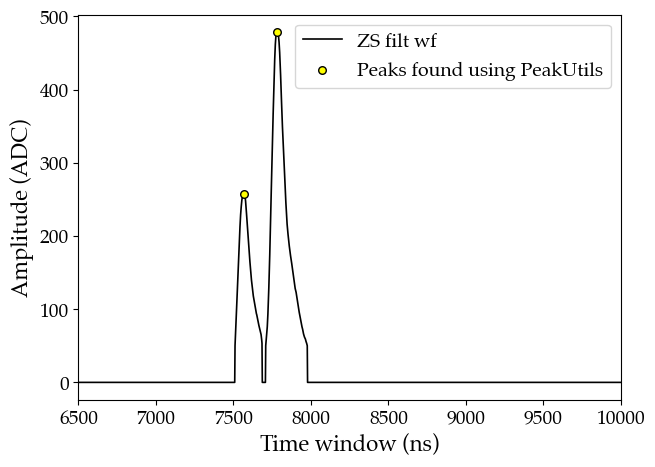

In [275]:
sel_ch      = 8
one_wf_ch   = np.array(RawTree[f'chan{sel_ch}/rdigi'].array())[12]
subt_wf_ch  = pf.subtract_baseline(one_wf_ch, mode=True, wf_range_bsl=(0, 650))
filt_swf_ch = savgol_filter(subt_wf_ch, window_length=50, polyorder=3)
zs_filt_wf  = pf.noise_suppression(filt_swf_ch, threshold=50)
idx_peaks   = pf.get_peaks_peakutils(zs_filt_wf, thres=50, min_dist=50, thres_abs=True)
print(idx_peaks)

plt.figure(figsize=(7, 5))
plt.plot(2*np.arange(len(zs_filt_wf)),  zs_filt_wf,  linewidth=1.2, color='k', label='ZS filt wf')
plt.scatter(2*idx_peaks, zs_filt_wf[idx_peaks], color='yellow', edgecolors='black', marker='o', s=30, zorder=2, label=f'Peaks found using PeakUtils')
#plt.axhline(y=50, color='indianred', label='thr = 50 ADC')
plt.xlabel('Time window (ns)', fontsize=16)
plt.ylabel('Amplitude (ADC)',  fontsize=16)
plt.xlim(6500, 10000)
plt.legend()
#plt.savefig('/Users/romoluque_c/LEGEND/BACON/Analysis_documentation/images/ZS_peaks_waveform.pdf', bbox_inches='tight')
plt.show()

#### Compute the hit map of one channel using one file

In [623]:
from functools         import partial
from matplotlib.colors import LogNorm

all_wfs  = pf.wfs_from_rawtree(RawTree, 8)
subt_wfs = np.array([pf.subtract_baseline(fwf, mode=True, wf_range_bsl=(0, 650))
                                          for fwf in all_wfs])

sg_filt_swfs = savgol_filter(subt_wfs, window_length=50, polyorder=3)

## Noise suppression
zs_sg_filt_swfs = pf.noise_suppression(sg_filt_swfs, threshold=50)

## Get peaks above thr_ADC
partial_get_peaks_peakutils = partial(pf.get_peaks_peakutils, thres=50, min_dist=50, thres_abs=True)
idx_peaks_ch = np.array(list(map(partial_get_peaks_peakutils, zs_sg_filt_swfs)), dtype=object)

height_peaks_ch = np.array([wf[idx_peaks_ch[i]] if len(idx_peaks_ch[i])!=0 else np.array([])
                                            for i,wf in enumerate(subt_wfs)], dtype=object)

In [624]:
len(idx_peaks_ch), len(height_peaks_ch)
height_peaks_ch.flatten()
len(np.concatenate(idx_peaks_ch)), len(np.concatenate(height_peaks_ch))

(34360, 34360)

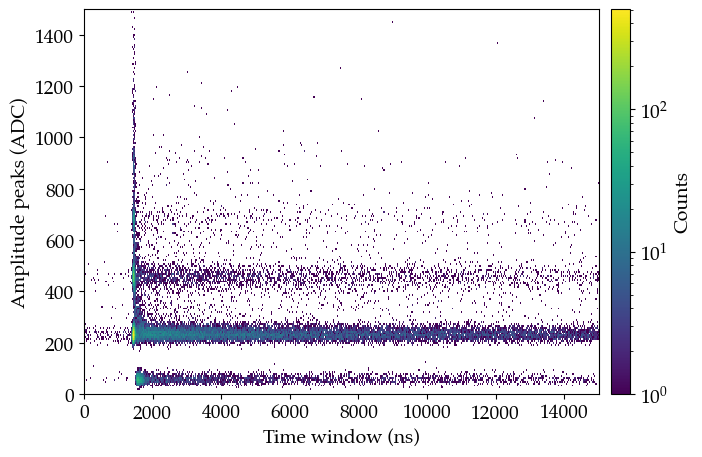

In [309]:
fig = plt.figure(figsize=(8, 5))
h = plt.hist2d(np.concatenate(idx_peaks_ch)*2, np.concatenate(height_peaks_ch), bins=(500, 200), range=((0, 15000), (0, 1500)), cmin=1, norm=LogNorm())
plt.xlabel('Time window (ns)',      fontsize=14)
plt.ylabel('Amplitude peaks (ADC)', fontsize=14)
plt.colorbar(h[3], label='Counts', pad=0.02)
#plt.savefig('/Users/romoluque_c/LEGEND/BACON/Analysis_documentation/images/hit_map_example.pdf', bbox_inches='tight')
plt.show()

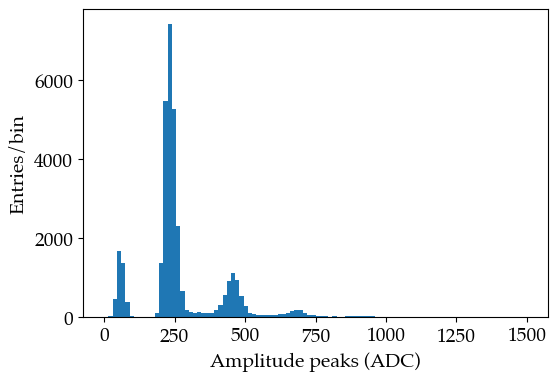

In [342]:
fig = plt.figure(figsize=(6, 4))
plt.hist(np.concatenate(height_peaks_ch), bins=100, range=(0, 1500))
plt.xlabel('Amplitude peaks (ADC)')
plt.ylabel('Entries/bin')
plt.show()

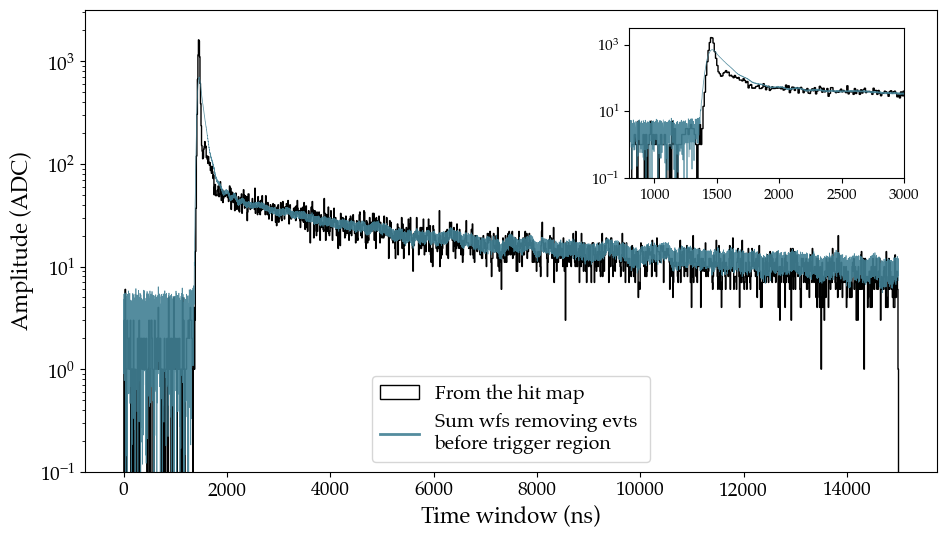

In [424]:
fig = plt.figure(figsize=(11, 6))
channel           = 8
all_wfs           = np.array(RawTree[f'chan{channel}/rdigi'].array())
all_wfs_rem_bckg  = np.array([wf for wf in all_wfs if np.std(wf[:wf_range_bsl])<15])
subt_wfs = pf.subtract_baseline(all_wfs_rem_bckg, mode=True, wf_range_bsl=(0, 500))
sum_wfs  = np.sum(subt_wfs, axis=0)

plt.hist(np.concatenate(idx_peaks_ch)*2, bins=1500, range=(0, 15000), log=True, histtype='step', label='From the hit map', color='k')
plt.plot(2*np.arange(len(sum_wfs)), sum_wfs/3500, linewidth=0.5, label='Sum wfs removing evts \nbefore trigger region', color=fav_col, alpha=0.9)
plt.xlabel('Time window (ns)', fontsize=16)
plt.ylabel('Amplitude (ADC)',  fontsize=16)
plt.ylim(1e-1, 3.1623e3)
plt.yscale('log')
leg = plt.legend(loc='lower center')
for line in leg.get_lines():
    line.set_linewidth(2)

from mpl_toolkits.axes_grid1.inset_locator import inset_axes
ax_inset = fig.add_axes([0.62, 0.60, 0.25, 0.25])
ax_inset.hist(np.concatenate(idx_peaks_ch)*2, bins=1500, range=(0, 15000), log=True, histtype='step', color='k')
ax_inset.plot(2*np.arange(len(sum_wfs)), sum_wfs/3500, linewidth=0.5, color=fav_col, alpha=0.9)
ax_inset.set_xlim(800, 3000)
ax_inset.set_ylim(1e-1, 3.1623e3)
ax_inset.tick_params(axis='x', labelsize=11)
ax_inset.tick_params(axis='y', labelsize=11)

#plt.savefig('/Users/romoluque_c/LEGEND/BACON/Analysis_documentation/images/hit_hist_and_summed_wfs_example_norm_evts.pdf', bbox_inches='tight')
plt.show()

In [625]:
idx_peaks_thr_ch = np.array([pf.get_values_thr_from_zswf(wf, idx_peaks_ch[i])
                                      for i,wf in enumerate(zs_sg_filt_swfs)], dtype=object)

height_peaks_deconv_ch = np.array([pf.peak_height_deconv(wf, idx_peaks_ch[i], height_peaks_ch[i].copy())
                                   for i, wf in enumerate(zs_sg_filt_swfs)], dtype=object)

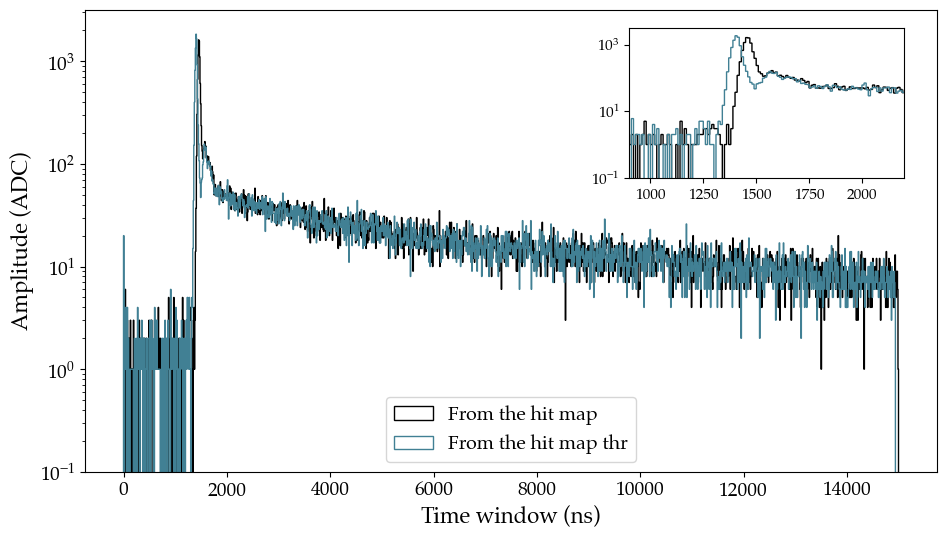

In [433]:
fig = plt.figure(figsize=(11, 6))
plt.hist(np.concatenate(idx_peaks_ch)*2,     bins=1500, range=(0, 15000), log=True, histtype='step', label='From the hit map', color='k')
plt.hist(np.concatenate(idx_peaks_thr_ch)*2, bins=1500, range=(0, 15000), log=True, histtype='step', label='From the hit map thr', color=fav_col)
plt.xlabel('Time window (ns)', fontsize=16)
plt.ylabel('Amplitude (ADC)',  fontsize=16)
plt.ylim(1e-1, 3.1623e3)
plt.yscale('log')
leg = plt.legend(loc='lower center')
for line in leg.get_lines():
    line.set_linewidth(2)
    
ax_inset = fig.add_axes([0.62, 0.60, 0.25, 0.25])
ax_inset.hist(np.concatenate(idx_peaks_ch)*2,     bins=1500, range=(0, 15000), log=True, histtype='step', color='k')
ax_inset.hist(np.concatenate(idx_peaks_thr_ch)*2, bins=1500, range=(0, 15000), log=True, histtype='step', color=fav_col)
ax_inset.set_xlim(900, 2200)
ax_inset.set_ylim(1e-1, 3.1623e3)
ax_inset.tick_params(axis='x', labelsize=11)
ax_inset.tick_params(axis='y', labelsize=11)

#plt.savefig('/Users/romoluque_c/LEGEND/BACON/Analysis_documentation/images/hit_hist_and_summed_wfs_example_norm_evts.pdf', bbox_inches='tight')
plt.show()

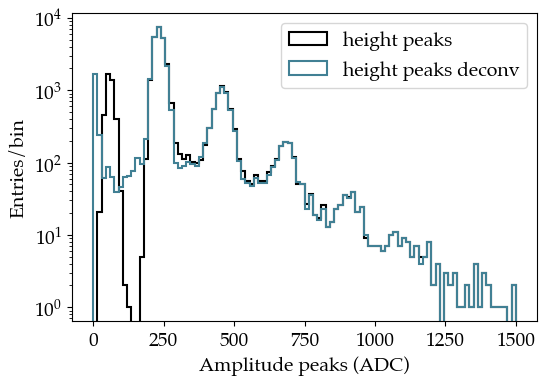

In [439]:
fig = plt.figure(figsize=(6, 4))
plt.hist(np.concatenate(height_peaks_ch),        bins=100, range=(0, 1500), histtype='step', linewidth=1.5, color='k',     label='height peaks')
plt.hist(np.concatenate(height_peaks_deconv_ch), bins=100, range=(0, 1500), histtype='step', linewidth=1.5, color=fav_col, label='height peaks deconv')
plt.xlabel('Amplitude peaks (ADC)')
plt.ylabel('Entries/bin')
plt.yscale('log')
plt.legend()
plt.show()

In [494]:
idx_peaks_no_bef_trigg_time_conc    = np.array([])
height_peaks_no_bef_trigg_time_conc = np.array([])
for i, j in zip(idx_peaks_ch, height_peaks_ch):
    if len(i)==0:
        continue
    if np.any(np.array(i) < 650):
        continue
    for ii,jj in zip(i,j):
        idx_peaks_no_bef_trigg_time_conc    = np.append(idx_peaks_no_bef_trigg_time_conc   , ii)
        height_peaks_no_bef_trigg_time_conc = np.append(height_peaks_no_bef_trigg_time_conc, jj)
        
idx_peaks_no_bef_trigg_time_conc2    = np.array([])
height_peaks_no_bef_trigg_time_conc2 = np.array([])
for i, j in zip(idx_peaks_thr_ch, height_peaks_deconv_ch):
    if len(i)==0:
        continue
    if np.any(np.array(i) < 650):
        continue
    for ii,jj in zip(i,j):
        idx_peaks_no_bef_trigg_time_conc2    = np.append(idx_peaks_no_bef_trigg_time_conc2   , ii)
        height_peaks_no_bef_trigg_time_conc2 = np.append(height_peaks_no_bef_trigg_time_conc2, jj)

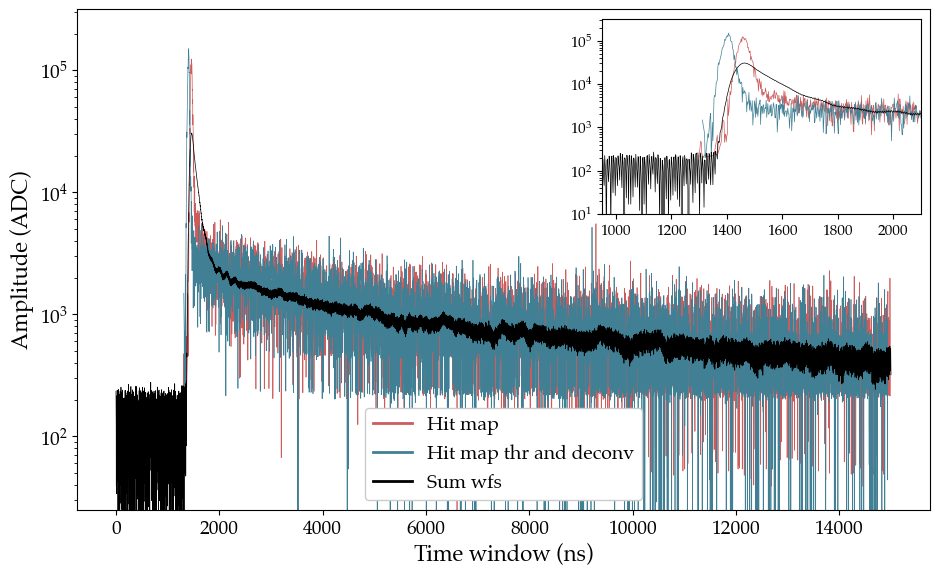

In [551]:
timestamps  = 2*idx_peaks_no_bef_trigg_time_conc    ### np.concatenate(idx_peaks_ch)*2
amplitudes  = height_peaks_no_bef_trigg_time_conc   ### np.concatenate(height_peaks_ch)
timestamps2 = 2*idx_peaks_no_bef_trigg_time_conc2   ### np.concatenate(idx_peaks_thr_ch)*2
amplitudes2 = height_peaks_no_bef_trigg_time_conc2  ### np.concatenate(height_peaks_deconv_ch)

unique_timestamps  = np.unique(timestamps)
unique_timestamps2 = np.unique(timestamps2)

sum_amplitudes  = [np.sum(amplitudes [timestamps  == timestamp ]) for timestamp  in unique_timestamps]
sum_amplitudes2 = [np.sum(amplitudes2[timestamps2 == timestamp2]) for timestamp2 in unique_timestamps2]

fig = plt.figure(figsize=(11, 6.5))
plt.plot(unique_timestamps,  sum_amplitudes,    linewidth=0.5, label='Hit map',                color='indianred')
plt.plot(unique_timestamps2, sum_amplitudes2,   linewidth=0.5, label='Hit map thr and deconv', color=fav_col)
plt.plot(2*np.arange(len(sum_wfs)), sum_wfs/80, linewidth=0.5, label='Sum wfs', color='k')

plt.xlabel('Time window (ns)', fontsize=16)
plt.ylabel('Amplitude (ADC)',  fontsize=16)
plt.ylim(2.5e1, 3.1623e5)
plt.yscale('log')
leg = plt.legend(loc='lower center', framealpha=1, fontsize=14)
for line in leg.get_lines():
    line.set_linewidth(2)
    
ax_inset = fig.add_axes([0.602, 0.565, 0.29, 0.30])
ax_inset.plot(unique_timestamps,  sum_amplitudes,    linewidth=0.5, color='indianred')
ax_inset.plot(unique_timestamps2, sum_amplitudes2,   linewidth=0.5, color=fav_col)
ax_inset.plot(2*np.arange(len(sum_wfs)), sum_wfs/80, linewidth=0.5, color='k')
ax_inset.set_xlim(950, 2100)
ax_inset.set_ylim(1e1, 3.1623e5)
ax_inset.set_yscale('log')
ax_inset.tick_params(axis='x', labelsize=11)
ax_inset.tick_params(axis='y', labelsize=11)

#plt.savefig('/Users/romoluque_c/LEGEND/BACON/Analysis_documentation/images/hit_map_and_summed_wfs_norm.pdf', bbox_inches='tight')
plt.show()

#### Compute the trigger time for all channels:

In [614]:
idx_peaks_ch_all        = []
height_peaks_ch_all     = []
idx_peaks_thr_all       = []
height_peaks_deconv_all = []

for ch in range(9):
    print(ch)
    wfs   = pf.wfs_from_rawtree(RawTree, ch)
    s_wfs = np.array([pf.subtract_baseline(fwf, mode=True, wf_range_bsl=(0, 650))
                                           for fwf in wfs])
    
    sgf_swfs = savgol_filter(s_wfs, window_length=50, polyorder=3)
    
    zs_sgf_swfs = pf.noise_suppression(sgf_swfs, threshold=50)
    
    partial_get_peaks_peakutils = partial(pf.get_peaks_peakutils, thres=50, min_dist=50, thres_abs=True)
    idx_peaks = np.array(list(map(partial_get_peaks_peakutils, zs_sgf_swfs)), dtype=object)
    
    height_peaks = np.array([wf[idx_peaks[i]] if len(idx_peaks[i])!=0 else np.array([])
                            for i,wf in enumerate(s_wfs)], dtype=object)
    
    idx_peaks_th = np.array([pf.get_values_thr_from_zswf(wf, idx_peaks[i])
                                      for i,wf in enumerate(zs_sgf_swfs)], dtype=object)

    height_peaks_dec = np.array([pf.peak_height_deconv(wf, idx_peaks[i], height_peaks[i].copy())
                                   for i, wf in enumerate(zs_sgf_swfs)], dtype=object)
    
    idx_peaks_ch_all       .append(idx_peaks)
    height_peaks_ch_all    .append(height_peaks)
    idx_peaks_thr_all      .append(idx_peaks_th)
    height_peaks_deconv_all.append(height_peaks_dec)

0
1
2
3
4
5
6
7
8


In [615]:
len(idx_peaks_ch_all)

9

In [616]:
idx_peaks_thr_all[0]

array([array([], dtype=float64), array([], dtype=float64),
       array([], dtype=float64), ..., array([], dtype=float64),
       array([], dtype=float64), array([], dtype=float64)], dtype=object)

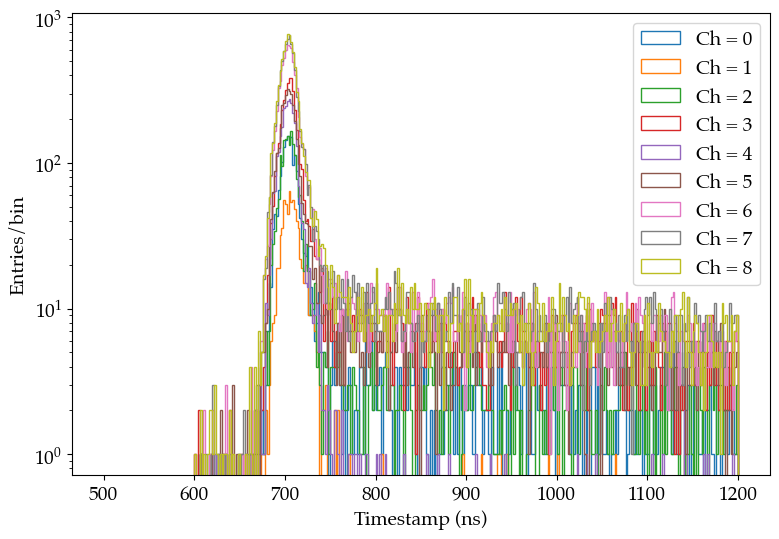

In [617]:
for ch, idx_peaks_thr_ch in enumerate(idx_peaks_thr_all):
    idx_ch = []
    for i in idx_peaks_thr_ch:
        if len(i)==0:
            continue
        if np.any(np.array(i) < 600):
            continue
        idx_ch.append(i[0])
    plt.hist(np.array(idx_ch), bins=350, range=(500, 1200), log=True, histtype='step', label=f'Ch = {ch}')
plt.xlabel('Timestamp (ns)')
plt.ylabel('Entries/bin')
plt.legend()
plt.show()

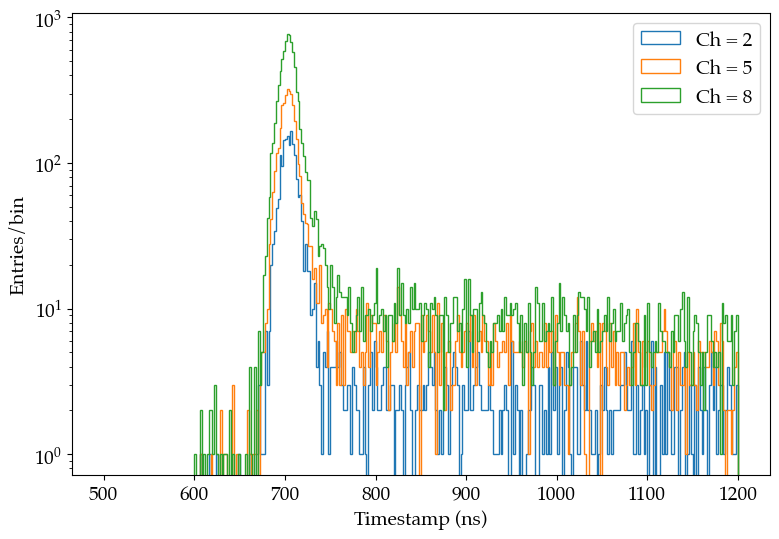

In [618]:
for ch, idx_peaks_thr_ch in enumerate(idx_peaks_thr_all):
    if ch in [2, 5, 8]:
        idx_ch = []
        for i in idx_peaks_thr_ch:
            if len(i)==0:
                continue
            if np.any(np.array(i) < 600):
                continue
            idx_ch.append(i[0])
        plt.hist(np.array(idx_ch), bins=350, range=(500, 1200), log=True, histtype='step', label=f'Ch = {ch}')
plt.xlabel('Timestamp (ns)')
plt.ylabel('Entries/bin')
plt.legend()
plt.show()

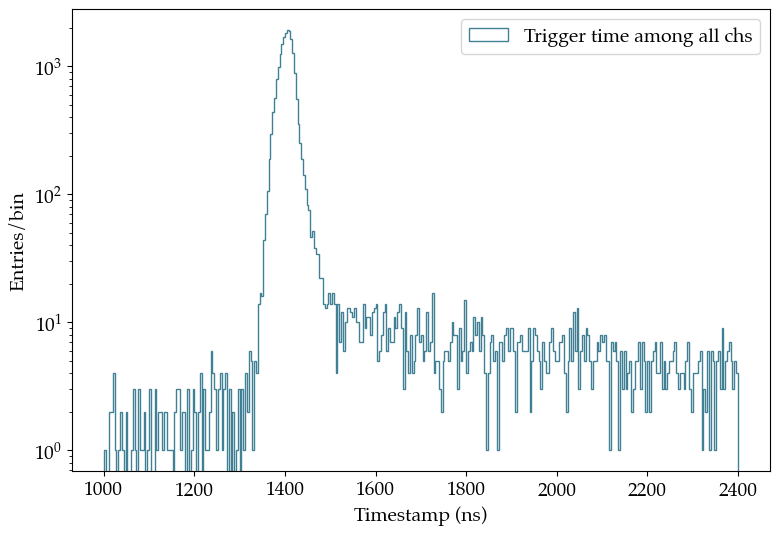

In [626]:
trigg_time = []
for el in np.array(idx_peaks_thr_all).T:
    if len(np.concatenate(el))==0:
        continue
    trigg_time.append(np.min(np.concatenate(el)))
    
plt.hist(np.array(trigg_time)*2, bins=350, range=(1000, 2400), log=True, histtype='step', label=f'Trigger time among all chs', color=fav_col)
plt.xlabel('Timestamp (ns)')
plt.ylabel('Entries/bin')
plt.legend()
plt.show()

In [634]:
idx_peaks_thr_all_corr = []
for el in np.array(idx_peaks_thr_all).T:
    print(el)
    if len(np.concatenate(el))==0:
        idx_peaks_thr_all_corr.append(el)
        continue
    idx_peaks_thr_all_corr.append(el+(750 - np.min(np.concatenate(el))))
    
idx_peaks_thr_all_corr = np.array(idx_peaks_thr_all_corr).T

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



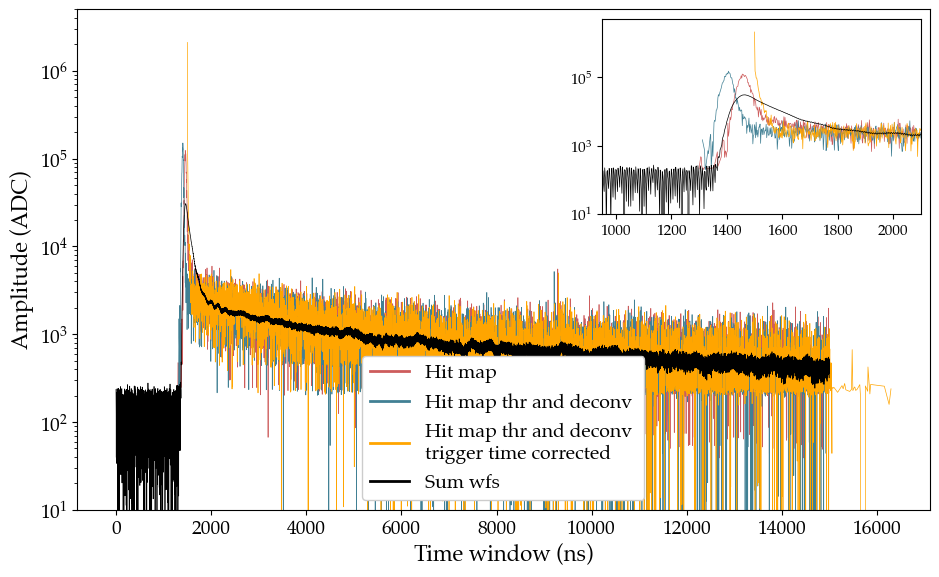

In [648]:
timestamps  = 2*idx_peaks_no_bef_trigg_time_conc    ### np.concatenate(idx_peaks_ch)*2
amplitudes  = height_peaks_no_bef_trigg_time_conc   ### np.concatenate(height_peaks_ch)
timestamps2 = 2*idx_peaks_no_bef_trigg_time_conc2   ### np.concatenate(idx_peaks_thr_ch)*2
amplitudes2 = height_peaks_no_bef_trigg_time_conc2  ### np.concatenate(height_peaks_deconv_ch)
timestamps3 = 2*np.concatenate(idx_peaks_thr_all_corr[8])   ### np.concatenate(idx_peaks_thr_all_corr)*2
amplitudes3 = np.concatenate(height_peaks_deconv_all[8])

sum_amplitudes  = [np.sum(amplitudes [timestamps  == timestamp ]) for timestamp  in np.unique(timestamps)]
sum_amplitudes2 = [np.sum(amplitudes2[timestamps2 == timestamp2]) for timestamp2 in np.unique(timestamps2)]
sum_amplitudes3 = [np.sum(amplitudes3[timestamps3 == timestamp3]) for timestamp3 in np.unique(timestamps3)]

fig = plt.figure(figsize=(11, 6.5))
plt.plot(np.unique(timestamps),  sum_amplitudes,    linewidth=0.5, label='Hit map',                color='indianred')
plt.plot(np.unique(timestamps2), sum_amplitudes2,   linewidth=0.5, label='Hit map thr and deconv', color=fav_col)
plt.plot(np.unique(timestamps3), sum_amplitudes3,   linewidth=0.5, label='Hit map thr and deconv \ntrigger time corrected',            color='orange')
plt.plot(2*np.arange(len(sum_wfs)), sum_wfs/80, linewidth=0.5, label='Sum wfs', color='k')

plt.xlabel('Time window (ns)', fontsize=16)
plt.ylabel('Amplitude (ADC)',  fontsize=16)
plt.ylim(1e1, 5e6)
plt.yscale('log')
leg = plt.legend(loc='lower center', framealpha=1, fontsize=14)
for line in leg.get_lines():
    line.set_linewidth(2)
    
ax_inset = fig.add_axes([0.602, 0.565, 0.29, 0.30])
ax_inset.plot(np.unique(timestamps),  sum_amplitudes,  linewidth=0.5, color='indianred')
ax_inset.plot(np.unique(timestamps2), sum_amplitudes2, linewidth=0.5, color=fav_col)
ax_inset.plot(np.unique(timestamps3), sum_amplitudes3, linewidth=0.5, color='orange')
ax_inset.plot(2*np.arange(len(sum_wfs)), sum_wfs/80, linewidth=0.5, color='k')
ax_inset.set_xlim(950, 2100)
ax_inset.set_ylim(1e1, 5e6)
ax_inset.set_yscale('log')
ax_inset.tick_params(axis='x', labelsize=11)
ax_inset.tick_params(axis='y', labelsize=11)

#plt.savefig('/Users/romoluque_c/LEGEND/BACON/Analysis_documentation/images/hit_map_and_summed_wfs_norm.pdf', bbox_inches='tight')
plt.show()

#### Make previous plot for all channels:

In [649]:
def get_conc_idx_and_height(indexes, heights):
    idx_c    = np.array([])
    height_c = np.array([])
    for i, j in zip(indexes, heights):
        if len(i)==0:
            continue
        if np.any(np.array(i) < 650):
            continue
        for ii,jj in zip(i,j):
            idx_c    = np.append(idx_c   , ii)
            height_c = np.append(height_c, jj)
            
    return idx_c, height_c

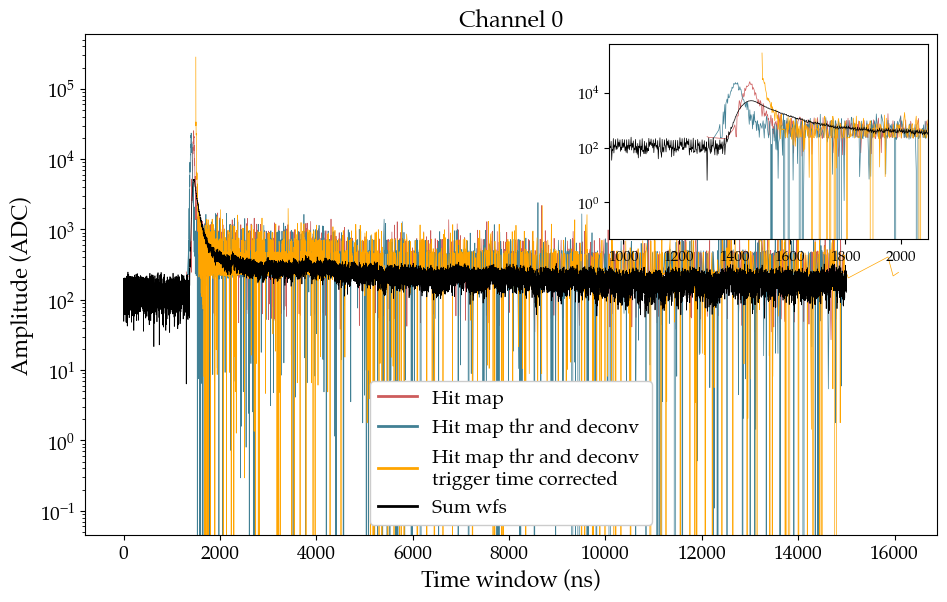

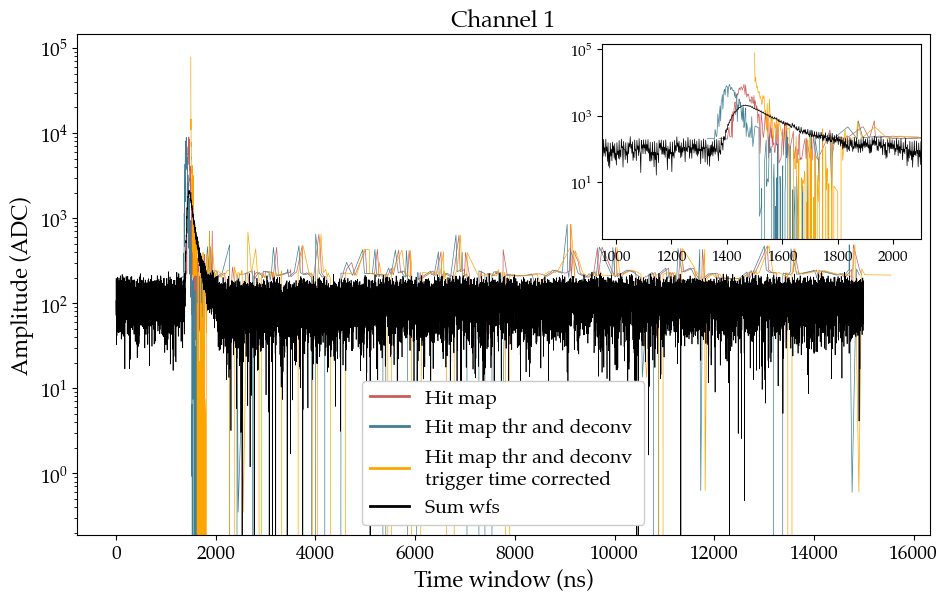

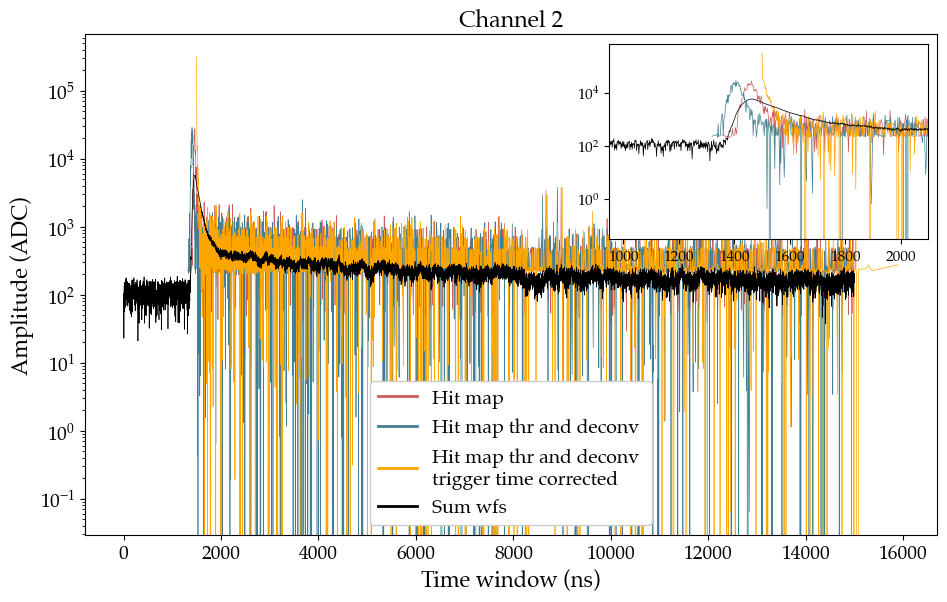

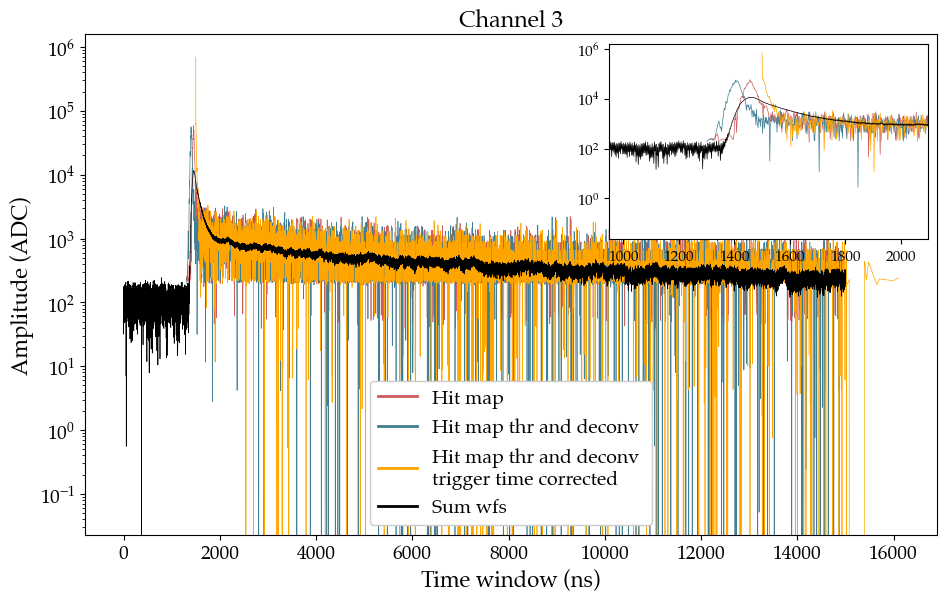

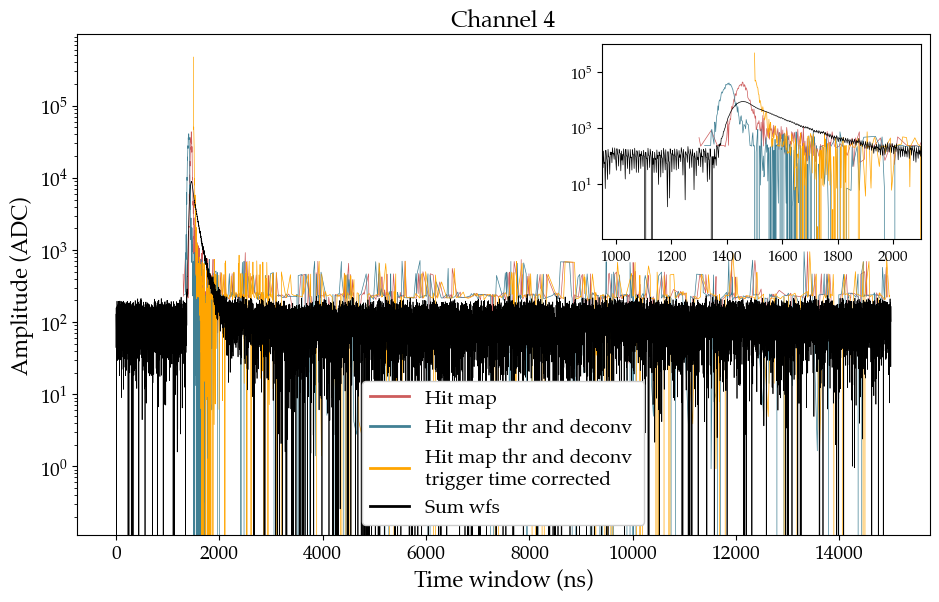

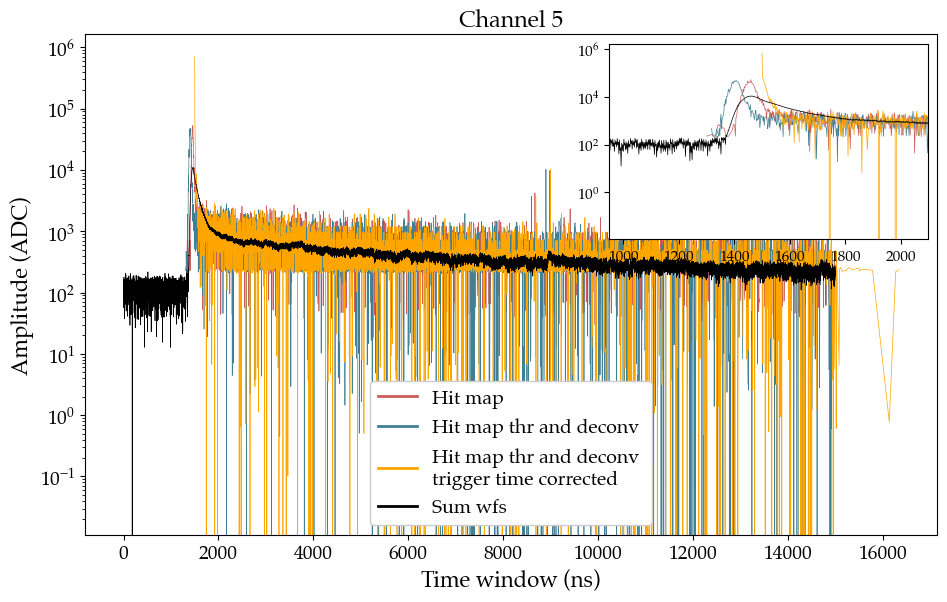

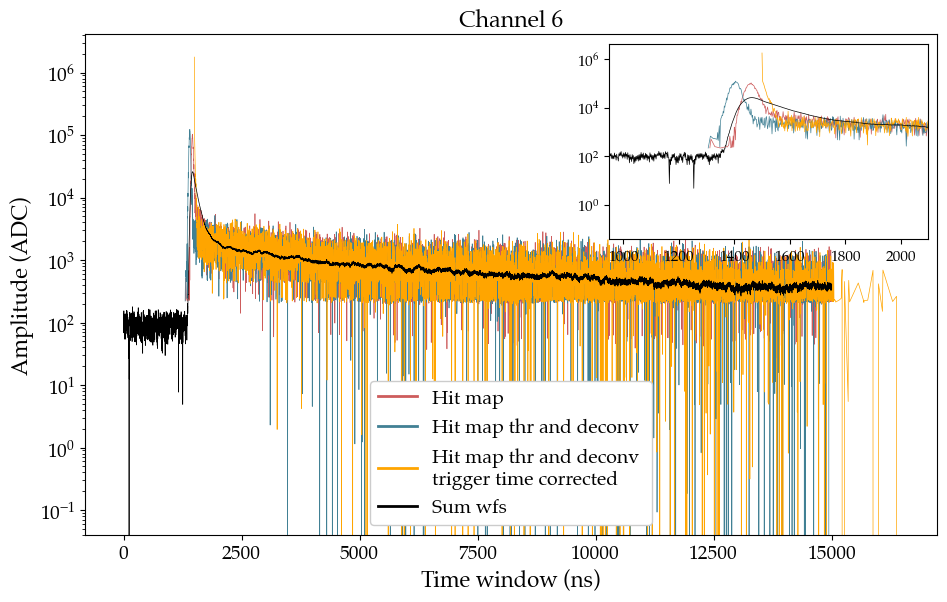

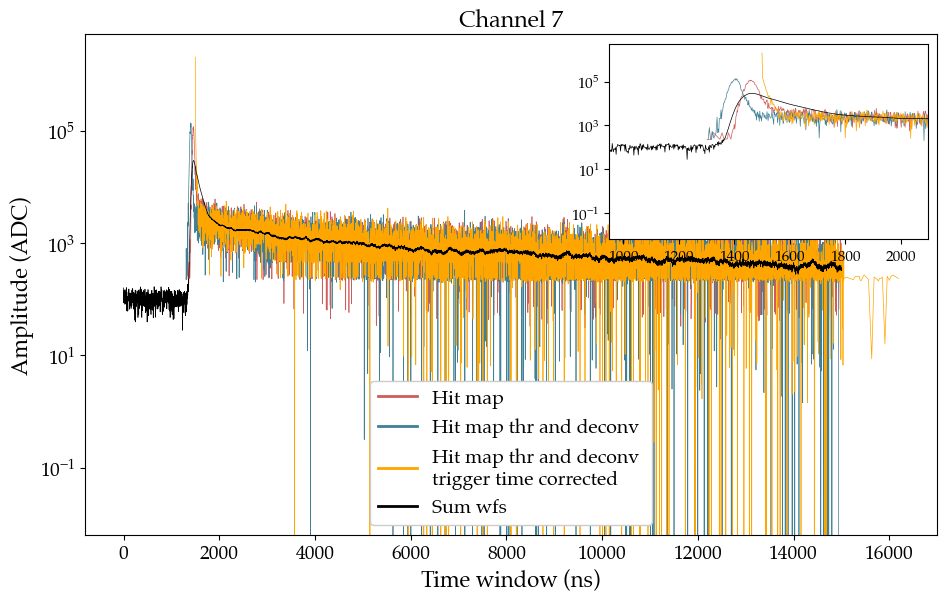

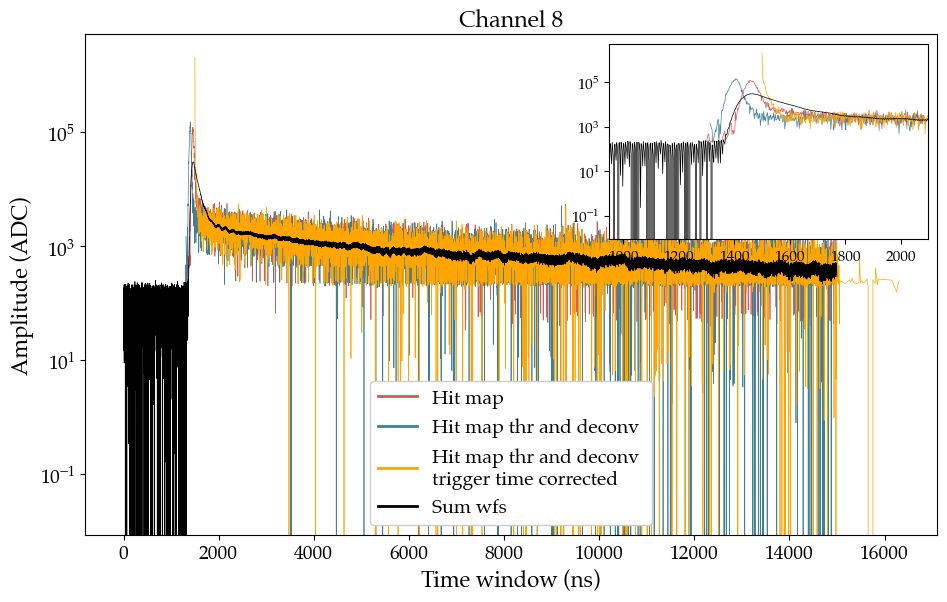

In [655]:
for ch in range(9):
    wfs          = np.array(RawTree[f'chan{ch}/rdigi'].array())
    wfs_rem_bckg = np.array([wf for wf in wfs if np.std(wf[:wf_range_bsl])<15])
    s_wfs        = pf.subtract_baseline(wfs_rem_bckg, mode=True, wf_range_bsl=(0, 650))
    sum_wfs      = np.sum(s_wfs, axis=0)
            
    timestamps0, amplitudes0 = get_conc_idx_and_height(idx_peaks_ch_all[ch], height_peaks_ch_all[ch])
    timestamps1, amplitudes1 = get_conc_idx_and_height(idx_peaks_thr_all[ch], height_peaks_deconv_all[ch])
    timestamps2, amplitudes2 = 2*np.concatenate(idx_peaks_thr_all_corr[ch]), np.concatenate(height_peaks_deconv_all[ch])
    
    sum_amplitudes0 = [np.sum(amplitudes0[timestamps0 == timestamp]) for timestamp in np.unique(timestamps0)]
    sum_amplitudes1 = [np.sum(amplitudes1[timestamps1 == timestamp]) for timestamp in np.unique(timestamps1)]
    sum_amplitudes2 = [np.sum(amplitudes2[timestamps2 == timestamp]) for timestamp in np.unique(timestamps2)]
    
    fig = plt.figure(figsize=(11, 6.5))
    plt.plot(np.unique(timestamps0)*2, sum_amplitudes0, linewidth=0.5, label='Hit map',                color='indianred')
    plt.plot(np.unique(timestamps1)*2, sum_amplitudes1, linewidth=0.5, label='Hit map thr and deconv', color=fav_col)
    plt.plot(np.unique(timestamps2),   sum_amplitudes2, linewidth=0.5, label='Hit map thr and deconv \ntrigger time corrected', color='orange')
    plt.plot(2*np.arange(len(sum_wfs)), sum_wfs/80,   linewidth=0.5, label='Sum wfs', color='k')
    
    plt.xlabel('Time window (ns)', fontsize=16)
    plt.ylabel('Amplitude (ADC)',  fontsize=16)
    plt.title(f'Channel {ch}')
    plt.yscale('log')
    leg = plt.legend(loc='lower center', framealpha=1, fontsize=14)
    for line in leg.get_lines():
        line.set_linewidth(2)
        
    ax_inset = fig.add_axes([0.602, 0.565, 0.29, 0.30])
    ax_inset.plot(np.unique(timestamps0)*2, sum_amplitudes0,  linewidth=0.5, color='indianred')
    ax_inset.plot(np.unique(timestamps1)*2, sum_amplitudes1, linewidth=0.5, color=fav_col)
    ax_inset.plot(np.unique(timestamps2),   sum_amplitudes2, linewidth=0.5, color='orange')
    ax_inset.plot(2*np.arange(len(sum_wfs)), sum_wfs/80, linewidth=0.5, color='k')
    ax_inset.set_xlim(950, 2100)
    ax_inset.set_yscale('log')
    ax_inset.tick_params(axis='x', labelsize=11)
    ax_inset.tick_params(axis='y', labelsize=11)
    
    #plt.savefig('/Users/romoluque_c/LEGEND/BACON/Analysis_documentation/images/hit_map_and_summed_wfs_norm.pdf', bbox_inches='tight')
    plt.show()

In [621]:
idx_peaks_thr_no_bef_trig_t = np.array([])
for i in idx_peaks_thr_ch:
    if len(i)==0:
        continue
    if np.any(np.array(i) < 600):
        continue
    idx_peaks_thr_no_bef_trig_t = np.append(idx_peaks_thr_no_bef_trig_t, i[0])

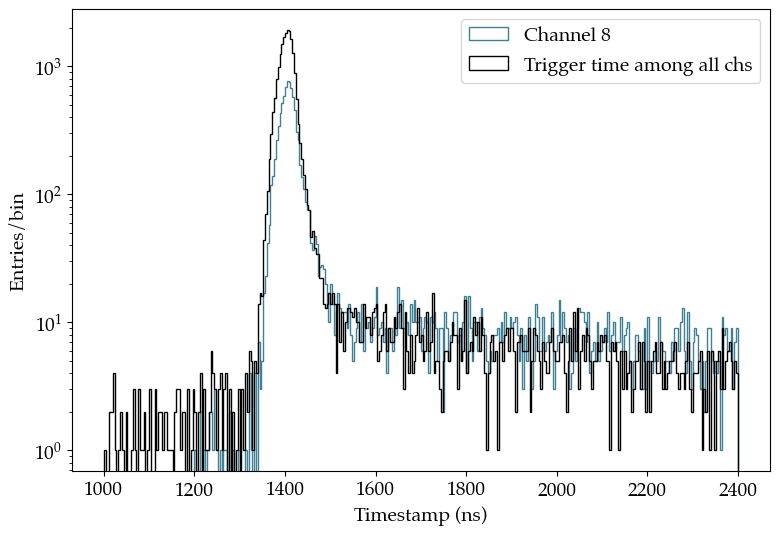

In [627]:
plt.hist(idx_peaks_thr_no_bef_trig_t*2, bins=350, range=(1000, 2400), log=True, histtype='step', label='Channel 8', color=fav_col)
plt.hist(np.array(trigg_time)*2,        bins=350, range=(1000, 2400), log=True, histtype='step', label=f'Trigger time among all chs', color='k')
plt.xlabel('Timestamp (ns)')
plt.ylabel('Entries/bin')
plt.legend()
plt.show()

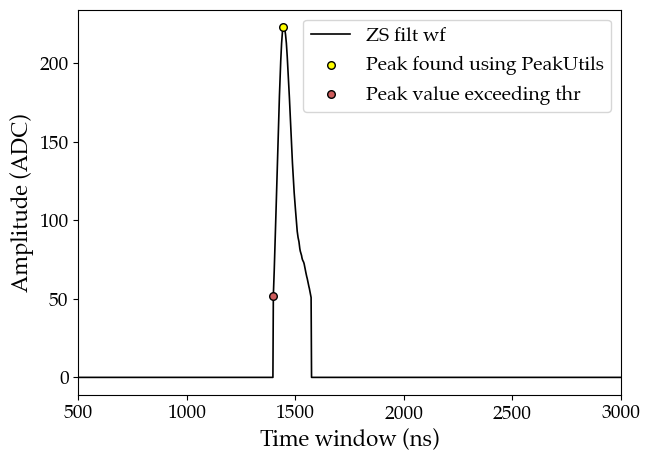

In [323]:
sel_ch        = 8
one_wf_ch     = np.array(RawTree[f'chan{sel_ch}/rdigi'].array())[0]
subt_wf_ch    = pf.subtract_baseline(one_wf_ch, mode=True, wf_range_bsl=(0, 650))
filt_swf_ch   = savgol_filter(subt_wf_ch, window_length=50, polyorder=3)
zs_filt_wf    = pf.noise_suppression(filt_swf_ch, threshold=50)
idx_peaks     = pf.get_peaks_peakutils(zs_filt_wf, thres=50, min_dist=50, thres_abs=True)
idx_peaks_thr = pf.get_values_thr_from_zswf(zs_filt_wf, idx_peaks)
idx_peaks_thr = idx_peaks_thr.astype(int)

plt.figure(figsize=(7, 5))
plt.plot(2*np.arange(len(zs_filt_wf)),  zs_filt_wf,  linewidth=1.2, color='k', label='ZS filt wf')
plt.scatter(2*idx_peaks,     zs_filt_wf[idx_peaks],     color='yellow',    edgecolors='black', marker='o', s=30, zorder=2, label=f'Peak found using PeakUtils')
plt.scatter(2*idx_peaks_thr, zs_filt_wf[idx_peaks_thr], color='indianred', edgecolors='black', marker='o', s=30, zorder=2, label=f'Peak value exceeding thr')
#plt.axhline(y=50, color='indianred', label='thr = 50 ADC')
plt.xlabel('Time window (ns)', fontsize=16)
plt.ylabel('Amplitude (ADC)',  fontsize=16)
plt.xlim(500, 3000)
plt.legend()
#plt.savefig('/Users/romoluque_c/LEGEND/BACON/Analysis_documentation/images/ZS_peak_waveform_thr.pdf', bbox_inches='tight')
plt.show()

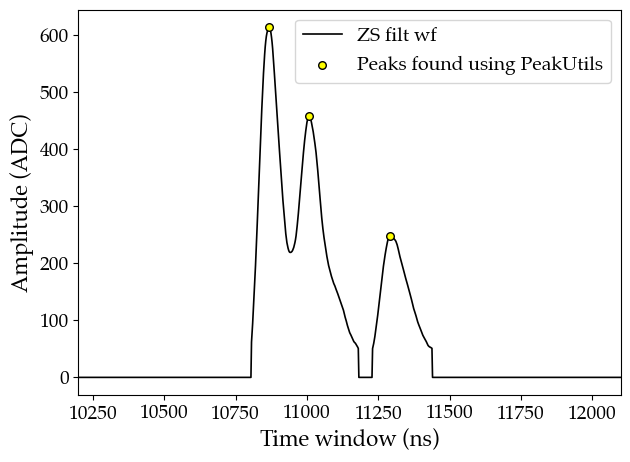

In [334]:
sel_ch        = 8
one_wf_ch     = np.array(RawTree[f'chan{sel_ch}/rdigi'].array())[37]
subt_wf_ch    = pf.subtract_baseline(one_wf_ch, mode=True, wf_range_bsl=(0, 650))
filt_swf_ch   = savgol_filter(subt_wf_ch, window_length=50, polyorder=3)
zs_filt_wf    = pf.noise_suppression(filt_swf_ch, threshold=50)
idx_peaks     = pf.get_peaks_peakutils(zs_filt_wf, thres=50, min_dist=50, thres_abs=True)
idx_peaks_thr = pf.get_values_thr_from_zswf(zs_filt_wf, idx_peaks)
idx_peaks_thr = idx_peaks_thr.astype(int)

plt.figure(figsize=(7, 5))
plt.plot(2*np.arange(len(zs_filt_wf)),  zs_filt_wf,  linewidth=1.2, color='k', label='ZS filt wf')
plt.scatter(2*idx_peaks,     zs_filt_wf[idx_peaks],     color='yellow',    edgecolors='black', marker='o', s=30, zorder=2, label=f'Peaks found using PeakUtils')
#plt.scatter(2*idx_peaks_thr, zs_filt_wf[idx_peaks_thr], color='indianred', edgecolors='black', marker='o', s=30, zorder=2, label=f'Peak value exceeding thr')
#plt.axhline(y=50, color='indianred', label='thr = 50 ADC')
plt.xlabel('Time window (ns)', fontsize=16)
plt.ylabel('Amplitude (ADC)',  fontsize=16)
plt.xlim(10200, 12100)
plt.legend()
#plt.savefig('/Users/romoluque_c/LEGEND/BACON/Analysis_documentation/images/ZS_peak_waveform_2nd_peak_minus_1st.pdf', bbox_inches='tight')
plt.show()

### Sum of all the events in a file

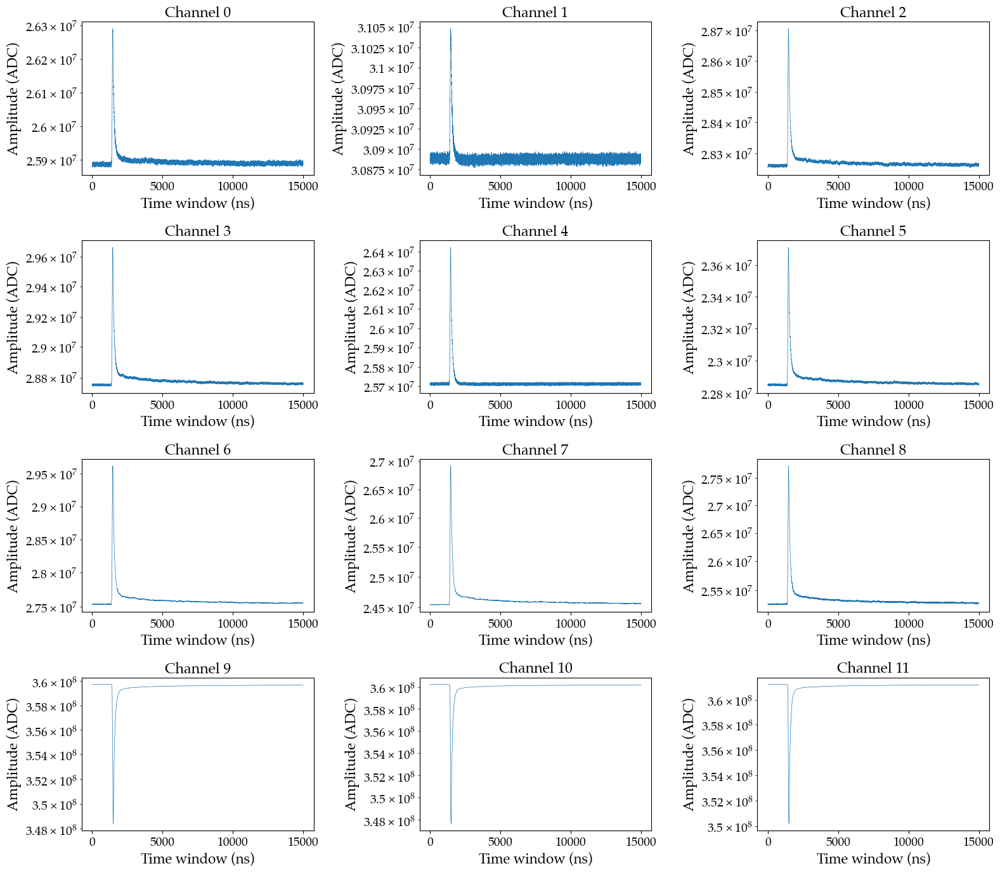

In [68]:
fig, axs = plt.subplots(4, 3, figsize=(16, 14))
for k in range(12):
    i = int(k/3)
    j = k%3
    sum_wf = np.sum(np.array(RawTree[f'chan{k}/rdigi'].array())[:], axis=0)
    axs[i][j].plot(2*np.arange(len(sum_wf)), sum_wf, linewidth=0.5)
    axs[i][j].set_xlabel('Time window (ns)', fontsize=16)
    axs[i][j].set_ylabel('Amplitude (ADC)', fontsize=16)
    axs[i][j].set_title(f"Channel {k}")
    axs[i][j].set_yscale('log')
plt.tight_layout()
plt.show()

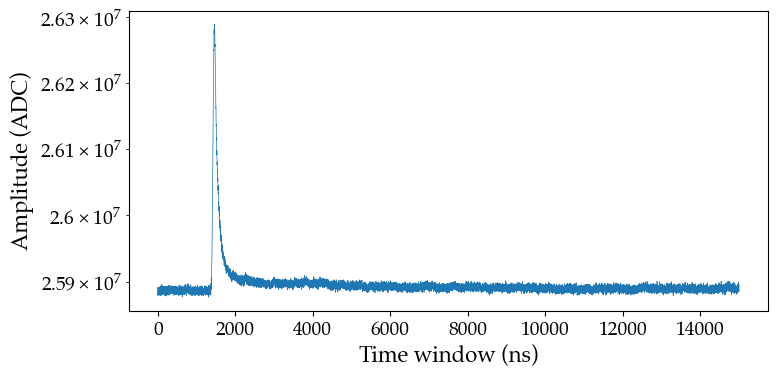

In [69]:
fig, ax = plt.subplots(1, 1, figsize=(8, 4))
sum_wf = np.sum(np.array(RawTree[f'chan0/rdigi'].array())[:], axis=0)
ax.plot(2*np.arange(len(sum_wf)), sum_wf, linewidth=0.5)
ax.set_xlabel('Time window (ns)', fontsize=16)
ax.set_ylabel('Amplitude (ADC)', fontsize=16)
ax.set_yscale('log')
plt.tight_layout()
plt.show()

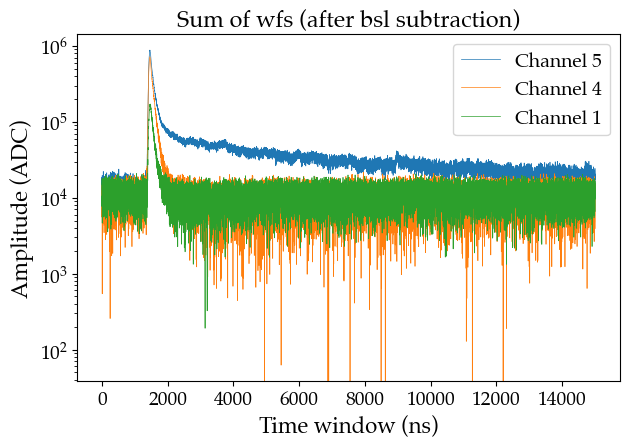

In [70]:
plt.figure(figsize=(7, 4.5))
for channel in [5, 4, 1]:
    all_wfs = np.array(RawTree[f'chan{channel}/rdigi'].array())
    subt_wf = pf.subtract_baseline(all_wfs, mode=True, wf_range_bsl=(0, 500))
    sum_wf  = np.sum(subt_wf, axis=0)
    plt.plot(2*np.arange(len(sum_wf)), sum_wf, linewidth=0.5, label=f'Channel {channel}')
plt.xlabel('Time window (ns)', fontsize=16)
plt.ylabel('Amplitude (ADC)', fontsize=16)
plt.title(f"Sum of wfs (after bsl subtraction)")
plt.yscale('log')
plt.legend()
plt.show()

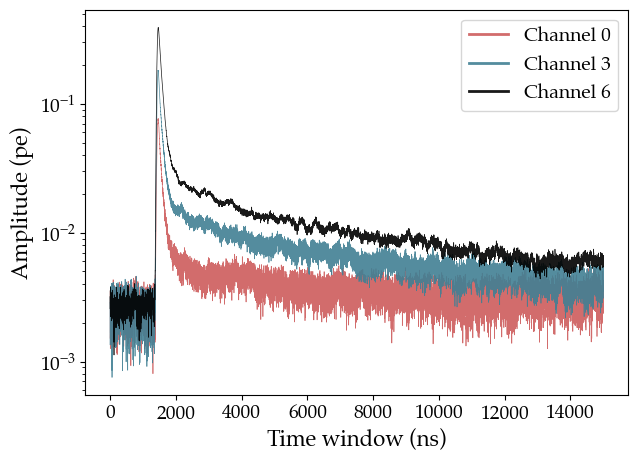

In [659]:
plt.figure(figsize=(7, 5))
gains036 = [228.9358, 215.3758, 226.9014]
for channel, col, gain in zip([0, 3, 6], ['indianred', fav_col, 'k'], gains036):
    all_wfs = np.array(RawTree[f'chan{channel}/rdigi'].array())
    subt_wf = pf.subtract_baseline(all_wfs, mode=True, wf_range_bsl=(0, 500))
    sum_wf  = np.sum(subt_wf, axis=0)
    plt.plot(2*np.arange(len(sum_wf)), sum_wf/(len(subt_wf)*gain), linewidth=0.5, label=f'Channel {channel}', color=col, alpha=0.9)
plt.xlabel('Time window (ns)', fontsize=16)
plt.ylabel('Amplitude (pe)', fontsize=16)
#plt.title(f"Sum of wfs (after bsl subtraction)")
plt.yscale('log')
leg = plt.legend()
for line in leg.get_lines():
    line.set_linewidth(2)
#plt.savefig('/Users/romoluque_c/LEGEND/BACON/Analysis_documentation/images/summed_wfs_example_norm_gain_and_evts.pdf', bbox_inches='tight')
plt.show()

23655 23466 189
All evts
Remove bckg


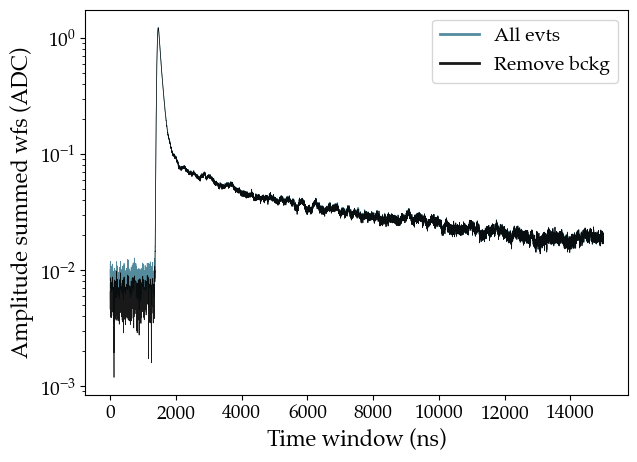

In [285]:
## Compare the sum of waveforms before and after removing bckg wfs
plt.figure(figsize=(7, 5))
channel           = 6
gain0             = gains036[2]
all_wfs           = np.array(RawTree[f'chan{channel}/rdigi'].array())
all_wfs_rem_bckg  = np.array([wf for wf in all_wfs if np.std(wf[:wf_range_bsl])<15])
all_wfs_removed   = np.array([wf for wf in all_wfs if np.std(wf[:wf_range_bsl])>=15])
print(len(all_wfs), len(all_wfs_rem_bckg), len(all_wfs_removed))
for set_wfs, lab, col in zip([all_wfs, all_wfs_rem_bckg], ['All evts', 'Remove bckg'], [fav_col, 'k']):
    print(lab)
    subt_wfs = pf.subtract_baseline(set_wfs, mode=True, wf_range_bsl=(0, 500))
    sum_wfs  = np.sum(subt_wfs, axis=0)
    plt.plot(2*np.arange(len(sum_wfs)), sum_wfs/(len(sum_wfs)*gain0), linewidth=0.5, label=lab, color=col, alpha=0.9)
plt.xlabel('Time window (ns)', fontsize=16)
plt.ylabel('Amplitude summed wfs (ADC)', fontsize=16)
#plt.title(f"Sum of wfs (after bsl subtraction)")
plt.yscale('log')
leg = plt.legend()
for line in leg.get_lines():
    line.set_linewidth(2)
#plt.savefig('/Users/romoluque_c/LEGEND/BACON/Analysis_documentation/images/summed_wfs_example_norm_gain_and_evts.pdf', bbox_inches='tight')
plt.show()

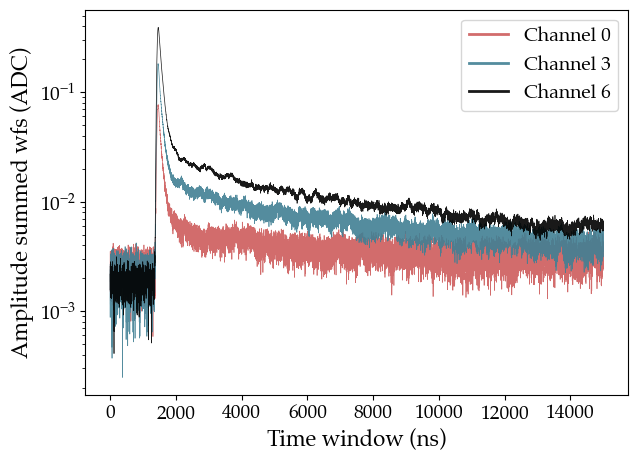

In [220]:
### Sum the previous wfs but rejecting the waveforms with signal before the trigger time
plt.figure(figsize=(7, 5))
for channel, col, gain in zip([0, 3, 6], ['indianred', fav_col, 'k'], [228.9358, 215.3758, 226.9014]):
    all_wfs = np.array(RawTree[f'chan{channel}/rdigi'].array())
    all_wfs = np.array([wf for wf in all_wfs if np.std(wf[:wf_range_bsl])<20])
    subt_wf = pf.subtract_baseline(all_wfs, mode=True, wf_range_bsl=(0, 500))
    sum_wf  = np.sum(subt_wf, axis=0)
    plt.plot(2*np.arange(len(sum_wf)), sum_wf/(len(subt_wf)*gain), linewidth=0.5, label=f'Channel {channel}', color=col, alpha=0.9)
plt.xlabel('Time window (ns)', fontsize=16)
plt.ylabel('Amplitude summed wfs (ADC)', fontsize=16)
#plt.title(f"Sum of wfs (after bsl subtraction)")
plt.yscale('log')
leg = plt.legend()
for line in leg.get_lines():
    line.set_linewidth(2)
#plt.savefig('/Users/romoluque_c/LEGEND/BACON/Analysis_documentation/images/summed_wfs_example_norm_gain_and_evts.pdf', bbox_inches='tight')
plt.show()

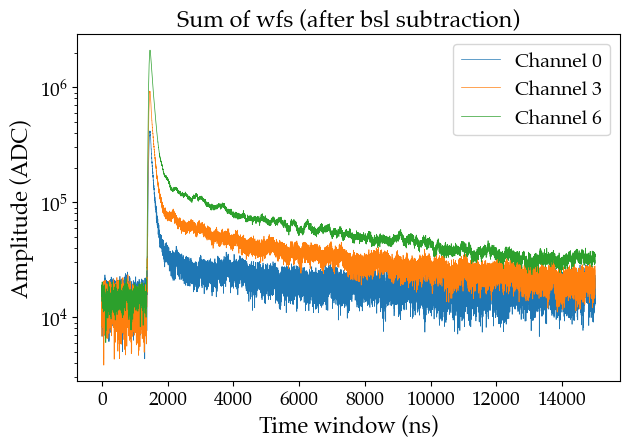

In [71]:
plt.figure(figsize=(7, 4.5))
for channel in [0, 3, 6]:
    all_wfs = np.array(RawTree[f'chan{channel}/rdigi'].array())
    subt_wf = pf.subtract_baseline(all_wfs, mode=True, wf_range_bsl=(0, 500))
    sum_wf  = np.sum(subt_wf, axis=0)
    plt.plot(2*np.arange(len(sum_wf)), sum_wf, linewidth=0.5, label=f'Channel {channel}')
plt.xlabel('Time window (ns)', fontsize=16)
plt.ylabel('Amplitude (ADC)', fontsize=16)
plt.title(f"Sum of wfs (after bsl subtraction)")
plt.yscale('log')
plt.legend()
plt.show()

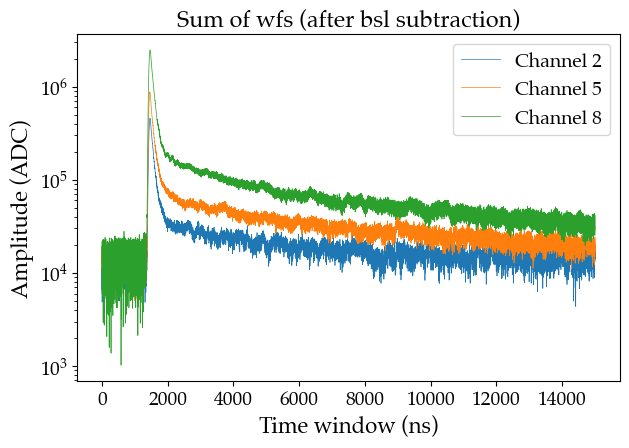

In [72]:
plt.figure(figsize=(7, 4.5))
for channel in [2, 5, 8]:
    all_wfs = np.array(RawTree[f'chan{channel}/rdigi'].array())
    subt_wf = pf.subtract_baseline(all_wfs, mode=True, wf_range_bsl=(0, 500))
    sum_wf  = np.sum(subt_wf, axis=0)
    plt.plot(2*np.arange(len(sum_wf)), sum_wf, linewidth=0.5, label=f'Channel {channel}')
plt.xlabel('Time window (ns)', fontsize=16)
plt.ylabel('Amplitude (ADC)', fontsize=16)
plt.title(f"Sum of wfs (after bsl subtraction)")
plt.yscale('log')
plt.legend()
plt.show()

### Looking at the different rows

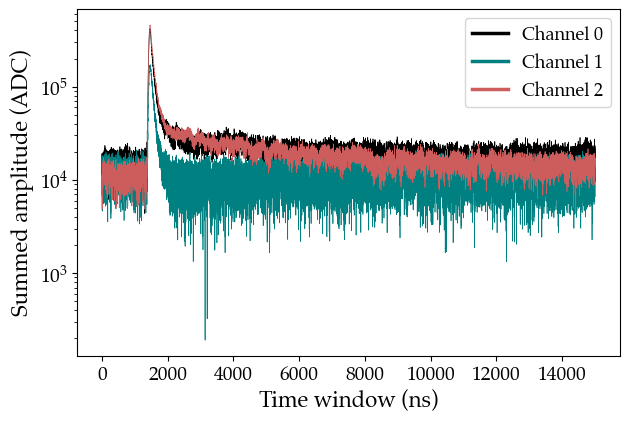

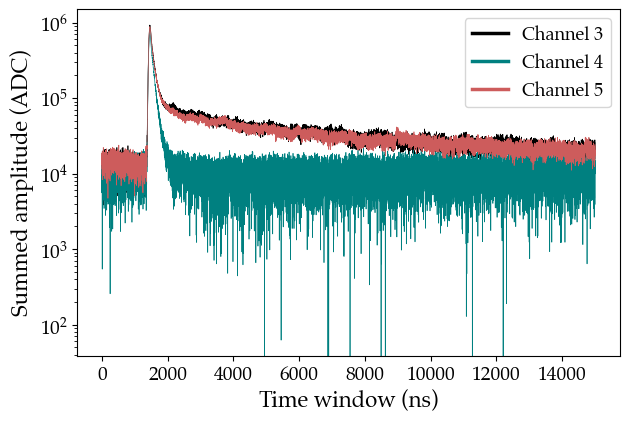

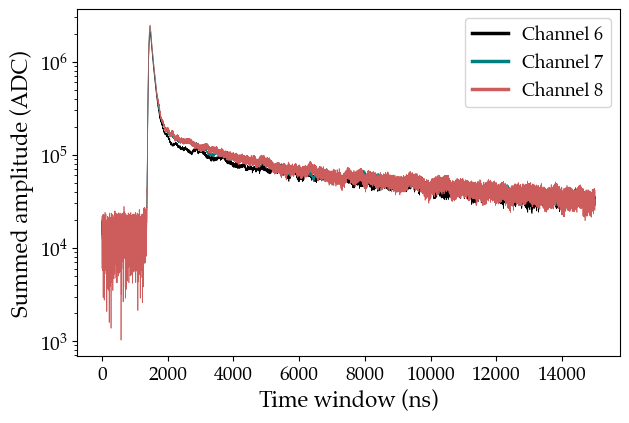

In [73]:
for ch_row in [[0, 1, 2], [3, 4, 5], [6, 7, 8]]:
    plt.figure(figsize=(7, 4.5))
    for channel, col in zip(ch_row, ['k', 'teal', 'indianred']):
        all_wfs = np.array(RawTree[f'chan{channel}/rdigi'].array())
        subt_wf = pf.subtract_baseline(all_wfs, mode=True, wf_range_bsl=(0, 500))
        sum_wf  = np.sum(subt_wf, axis=0)
        plt.plot(2*np.arange(len(sum_wf)), sum_wf, linewidth=0.5, label=f'Channel {channel}', color=col)
    plt.xlabel('Time window (ns)',        fontsize=16)
    plt.ylabel('Summed amplitude (ADC)', fontsize=16)
    plt.yscale('log')
    plt.legend()
    leg = plt.legend(ncol=1, fontsize=13)
    for line in leg.get_lines():
        line.set_linewidth(2.5)
    plt.show()

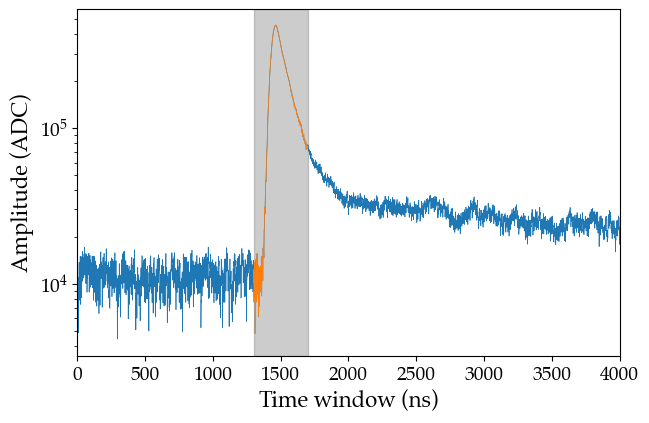

In [74]:
plt.figure(figsize=(7, 4.5))
channel = 2
all_wfs = np.array(RawTree[f'chan{channel}/rdigi'].array())
subt_wf = pf.subtract_baseline(all_wfs, mode=True, wf_range_bsl=(0, 500))
sum_wf  = np.sum(subt_wf, axis=0)
plt.plot(2*np.arange(len(sum_wf)), sum_wf, linewidth=0.5)
plt.plot(2*650+2*np.arange(len(sum_wf[650:850])), sum_wf[650:850], linewidth=0.5)
plt.axvspan(650*2, 850*2, color='grey', alpha=0.4)
plt.xlabel('Time window (ns)', fontsize=16)
plt.ylabel('Amplitude (ADC)', fontsize=16)
plt.yscale('log')
plt.xlim(0, 4000)
plt.show()

### Analysis npz

In [75]:
evts_path = '/Users/romoluque_c/LEGEND/BACON/data_npz/'

all_channels = 9

peak_heights = {}

pos_date1 = 42
pos_date2 = 52

def get_date(filename):
    date_str = filename[pos_date1:pos_date2]
    date = datetime.strptime(date_str, '%m_%d_%Y')
    return date

files        = os.listdir(evts_path)
filt_files   = [file for file in files if file.startswith("BACoN_sig_processing_cal_using_height_run")]
sorted_files = sorted(filt_files, key=get_date)

for filename in sorted_files:
    my_file = evts_path+filename
    d = np.load(my_file, allow_pickle=True)
    
    date = filename[pos_date1:pos_date2]
    
    if date not in peak_heights:
        peak_heights_ch = [np.array([]) for _ in range(all_channels)]

    try:
        for channel in range(all_channels):
            peak_heights_ch[channel] = np.concatenate((peak_heights_ch[channel], d['peak_height_all_channels'][channel][0]))
    except Exception as e:
        print(e)
        continue
    peak_heights[date] = np.array(peak_heights_ch, dtype=object)

list index out of range
list index out of range
list index out of range
list index out of range
list index out of range
list index out of range
list index out of range
list index out of range
list index out of range
list index out of range
list index out of range
list index out of range
list index out of range
list index out of range
list index out of range
list index out of range
list index out of range
list index out of range
list index out of range
list index out of range
list index out of range
list index out of range
list index out of range
list index out of range
list index out of range
list index out of range
list index out of range
list index out of range
list index out of range
list index out of range
list index out of range
list index out of range
list index out of range
list index out of range
list index out of range
list index out of range
list index out of range
list index out of range
list index out of range
list index out of range
list index out of range
list index out o

In [76]:
peak_heights['11_20_2023'].shape

(9,)

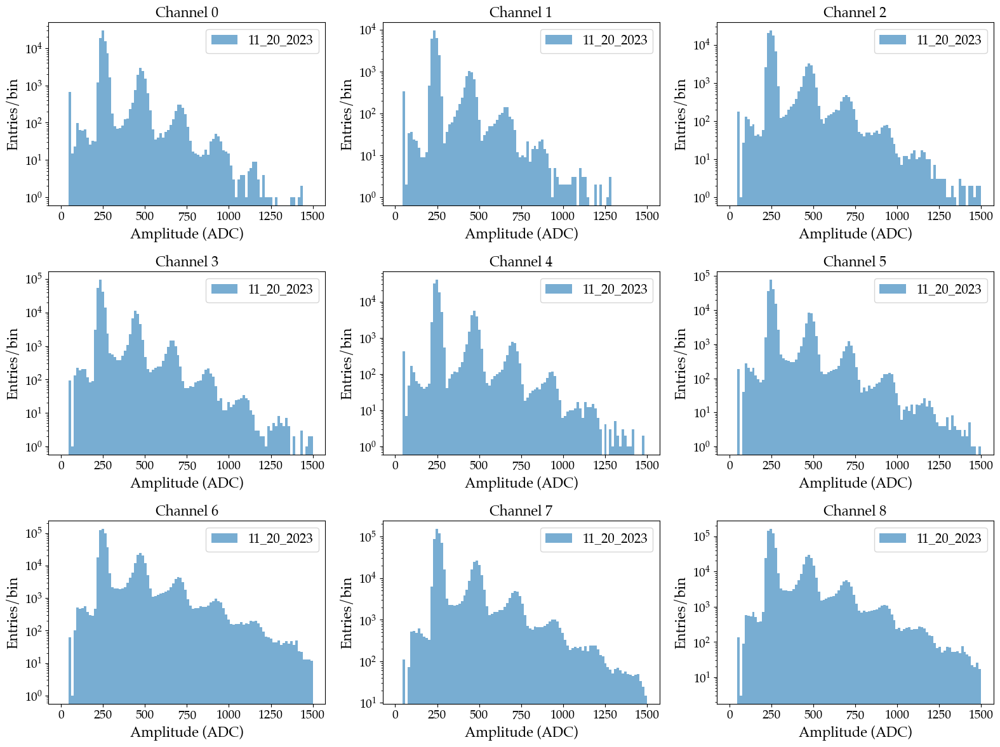

In [77]:
select_date = '11_20_2023'

fig, axs = plt.subplots(3, 3, figsize=(16, 12))
for k in range(9):
    i = int(k/3)
    j = k%3
    axs[i][j].hist(peak_heights[select_date][k], bins=100, range=(0,1500), log=True, label=f'{select_date}', alpha=0.6)
    axs[i][j].set_xlabel('Amplitude (ADC)', fontsize=16)
    axs[i][j].set_ylabel('Entries/bin',      fontsize=16)
    axs[i][j].set_title(f"Channel {k}",      fontsize=16)
    axs[i][j].legend(fontsize=15)
plt.tight_layout()
plt.show()

### Fit spectra

In [78]:
# Define the function for a single Gaussian peak
def gaussian(x, amplitude, mean, stddev):
    return amplitude * np.exp(-(x - mean)**2 / (2 * stddev**2))

# Define the function for multiple Gaussian peaks
def multi_gaussian(x, *params):
    n_peaks = len(params) // 3
    y = np.zeros_like(x)
    for i in range(n_peaks):
        amplitude = params[i * 3]
        mean = params[i * 3 + 1]
        stddev = params[i * 3 + 2]
        y += gaussian(x, amplitude, mean, stddev)
    return y

def shift_to_bin_centers(x):
    """
    Return bin centers, given bin lower edges.
    """
    return x[:-1] + np.diff(x) * 0.5

def truncate(number, decimals=0):
    """
    Returns a value truncated to a specific number of decimal places.
    """
    if not isinstance(decimals, int):
        raise TypeError("decimal places must be an integer.")
    elif decimals < 0:
        raise ValueError("decimal places has to be 0 or more.")
    elif decimals == 0:
        return math.trunc(number)

    factor = 10.0 ** decimals
    return math.trunc(number * factor) / factor

def plot_linear_fit(y, yerr):
    x    = np.arange(len(y))+1
    slope, intercept, r_value, p_value, std_err = stats.linregress(x, y)
    line = slope*x + intercept
    
    fig = plt.figure(figsize=(8,5))
    plt.errorbar(x, y, yerr=yerr, marker='_', markersize=5, linestyle='', c='k', label=f'Measured gain values')
    plt.plot(x, line, color='r', alpha=0.7, label=f'Fit: y = x*{round(slope, 2)} - {round(np.abs(intercept), 2)}, \n     R$^2$ = {truncate(r_value, 2)}')
    
    plt.xlabel('Peak number')
    plt.ylabel('Mu from fit (ADC)')
    plt.legend(fontsize=14, loc='upper left')
    plt.show()
    return slope

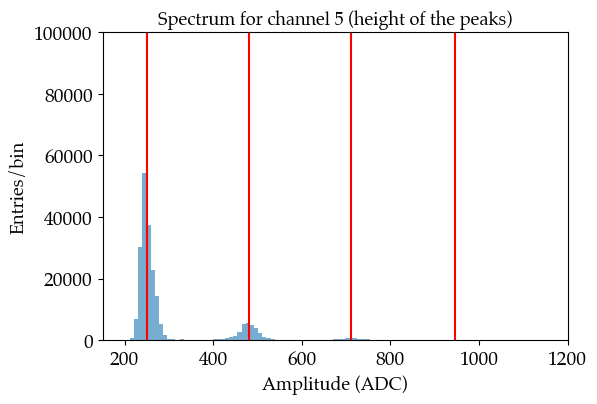

In [79]:
sel_channel = 5

plt.figure(figsize=(6, 4))
y, x, _ = plt.hist(peak_heights[select_date][sel_channel], bins=150, range=(100,1500), log=False, alpha=0.6)
plt.axvline(x=250, color='r')
plt.axvline(x=480, color='r')
plt.axvline(x=710, color='r')
plt.axvline(x=945, color='r')
plt.xlabel('Amplitude (ADC)',      fontsize=13)
plt.ylabel('Entries/bin',           fontsize=13)
plt.title(f"Spectrum for channel {sel_channel} (height of the peaks)", fontsize=13)
plt.xlim(150, 1200)
plt.ylim(0, 100000)
plt.show()

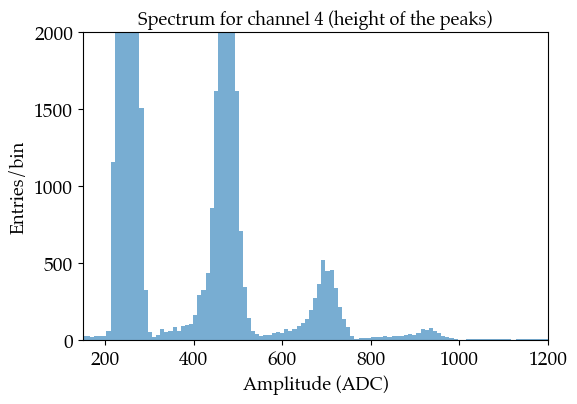

In [80]:
sel_channel = 4

plt.figure(figsize=(6, 4))
y, x, _ = plt.hist(peak_heights[select_date][sel_channel], bins=150, range=(100,1500), log=False, alpha=0.6)
plt.xlabel('Amplitude (ADC)',      fontsize=13)
plt.ylabel('Entries/bin',           fontsize=13)
plt.title(f"Spectrum for channel {sel_channel} (height of the peaks)", fontsize=13)
plt.xlim(150, 1200)
plt.ylim(0, 2000)
plt.show()

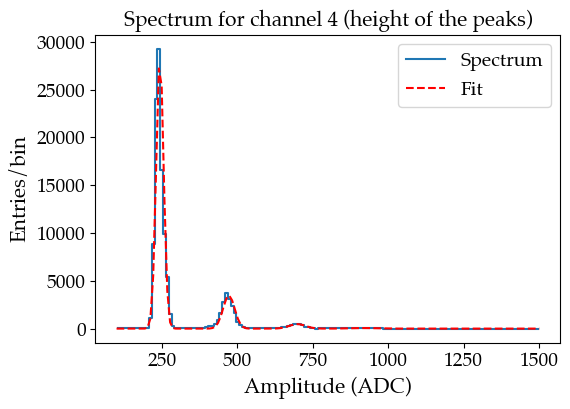

In [81]:
initial_guess = [5000, 240, 20, 1000, 470, 25, 100, 700, 30, 100, 920, 50]  # Initial guess for the parameters
popt, pcov = curve_fit(multi_gaussian, shift_to_bin_centers(x), y, p0=initial_guess)

perr = np.sqrt(np.diag(pcov))

all_means     = np.array([popt[i*3+1] for i in range(len(popt)//3)])
all_means_err = np.array([perr[i*3+1] for i in range(len(perr)//3)])

plt.figure(figsize=(6, 4))
plt.step(shift_to_bin_centers(x), y, label='Spectrum')
plt.plot(x, multi_gaussian(x, *popt), 'r--', label='Fit')
plt.xlabel('Amplitude (ADC)',      fontsize=15)
plt.ylabel('Entries/bin',           fontsize=15)
plt.title(f"Spectrum for channel {sel_channel} (height of the peaks)", fontsize=15)
plt.legend()
plt.show()

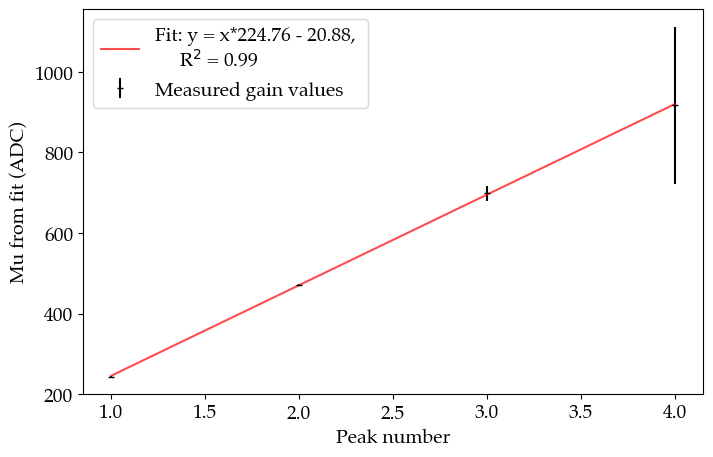

224.75930337940463

In [82]:
plot_linear_fit(all_means, all_means_err)

In [83]:
def fit_spectrum_and_plot(data, channel=7, initial_guess=[1000, 100, 20]):
    
    plt.figure(figsize=(7, 5))
    y, x, _ = plt.hist(data, bins=150, range=(100,1500), log=False, alpha=0.6)

    popt, pcov = curve_fit(multi_gaussian, shift_to_bin_centers(x), y, p0=initial_guess)
    
    plt.plot(x, multi_gaussian(x, *popt), 'r--', label='Fit')
    plt.xlabel('Amplitude (ADC)',      fontsize=15)
    plt.ylabel('Entries/bin',           fontsize=15)
    plt.title(f"Spectrum for channel {sel_channel} (height of the peaks)", fontsize=15)
    plt.tight_layout()
    plt.show()
    
    perr = np.sqrt(np.diag(pcov))
    
    all_means     = np.array([popt[i*3+1] for i in range(len(popt)//3)])
    all_means_err = np.array([perr[i*3+1] for i in range(len(perr)//3)])
    
    return plot_linear_fit(all_means, all_means_err)

In [84]:
initial_guess_ch = {0: [ 15000, 245, 20,  2000, 475, 25,  200, 710, 30,  20, 925, 40],
                    1: [  6000, 235, 20,   600, 445, 25,  100, 650, 30,  20, 870, 40],
                    2: [ 16000, 250, 20,  2000, 475, 25,  400, 700, 30,  50, 925, 40],
                    3: [ 60000, 230, 20,  8000, 445, 25, 1000, 660, 30, 100, 875, 40],
                    4: [ 30000, 245, 20,  4000, 475, 25,  500, 700, 30,  70, 935, 40],
                    5: [ 50000, 250, 20,  5000, 480, 25,  700, 710, 30, 100, 945, 40],
                    6: [ 90000, 245, 20, 18000, 470, 25, 3000, 700, 30, 500, 920, 40],
                    7: [100000, 250, 20, 16000, 485, 25,  500, 710, 30, 500, 950, 40],
                    8: [110000, 245, 20, 20000, 475, 25, 4000, 700, 30, 600, 920, 40]}

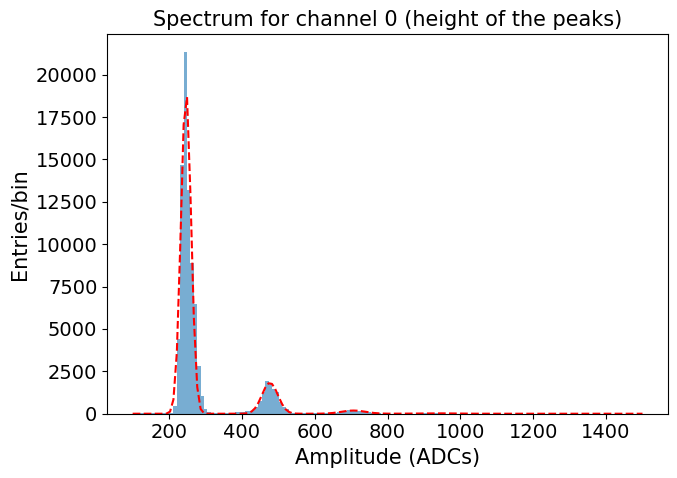

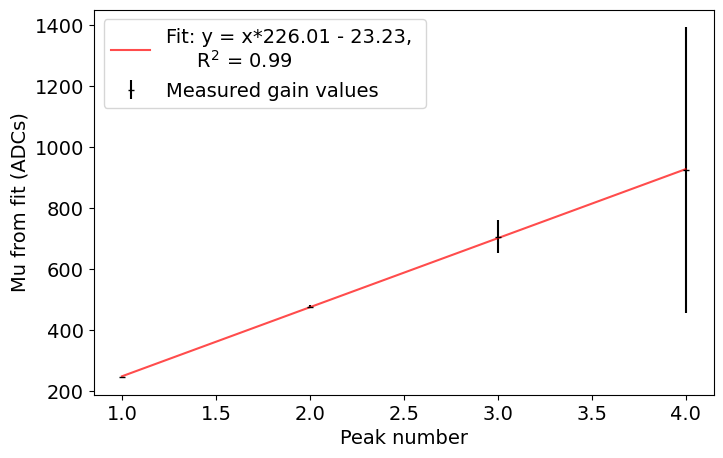

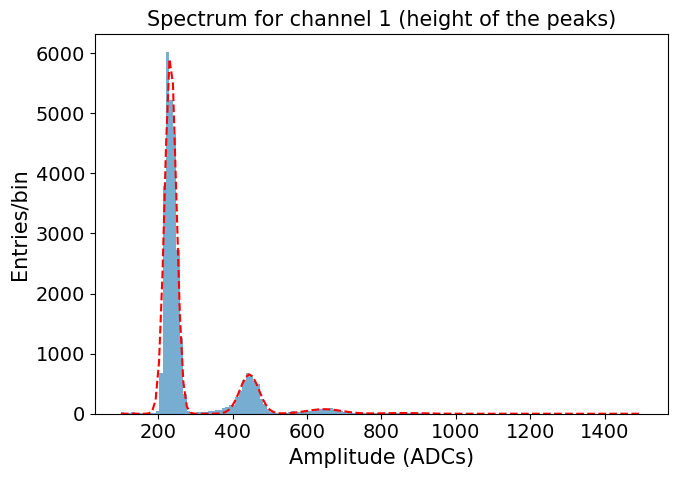

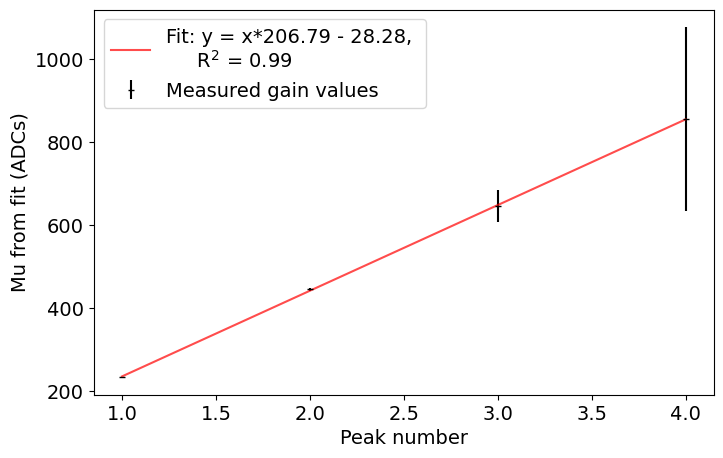

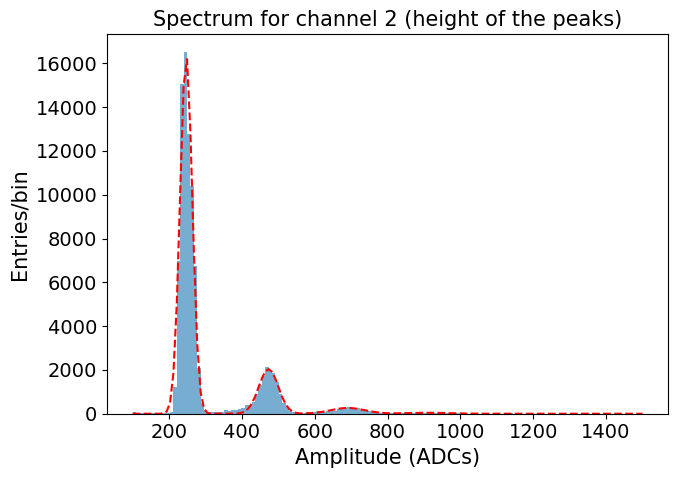

...

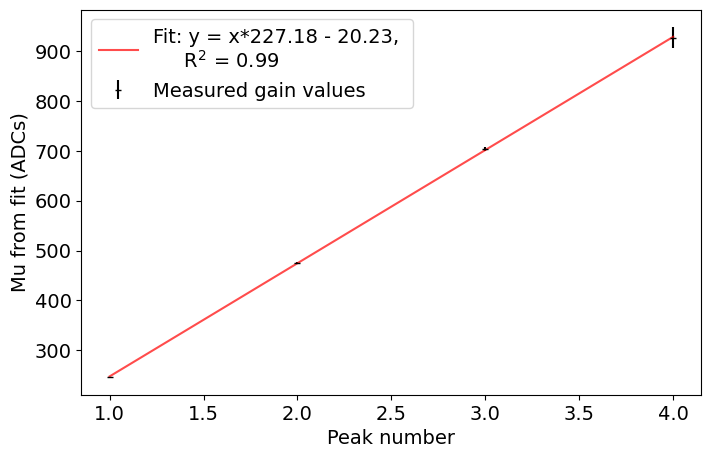

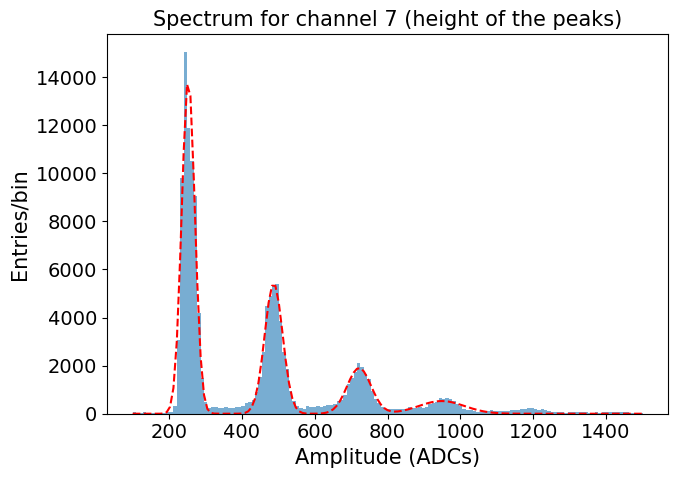

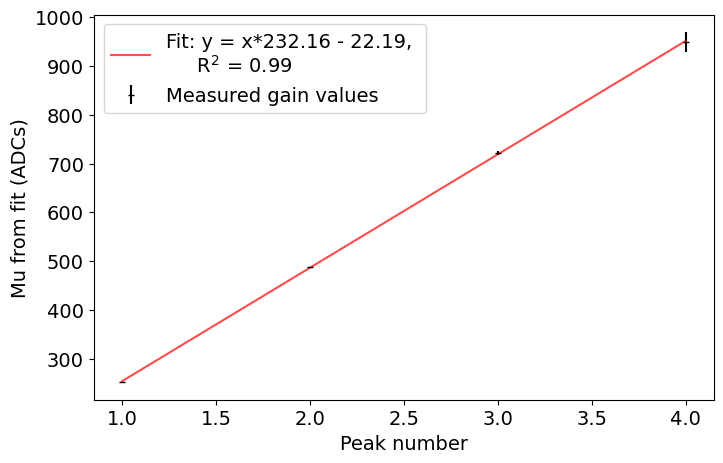

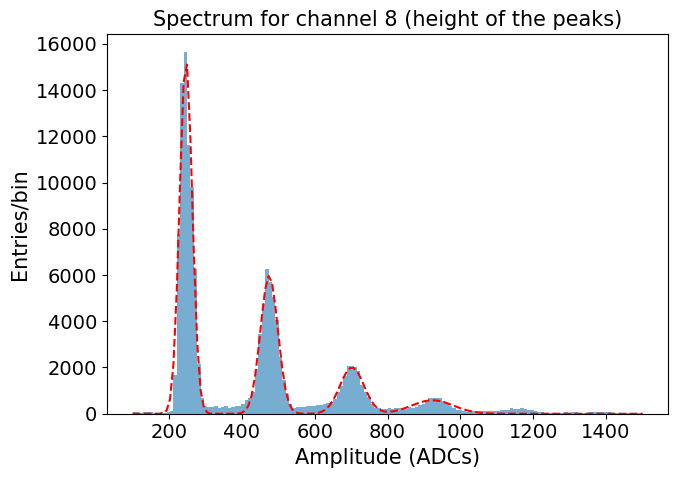

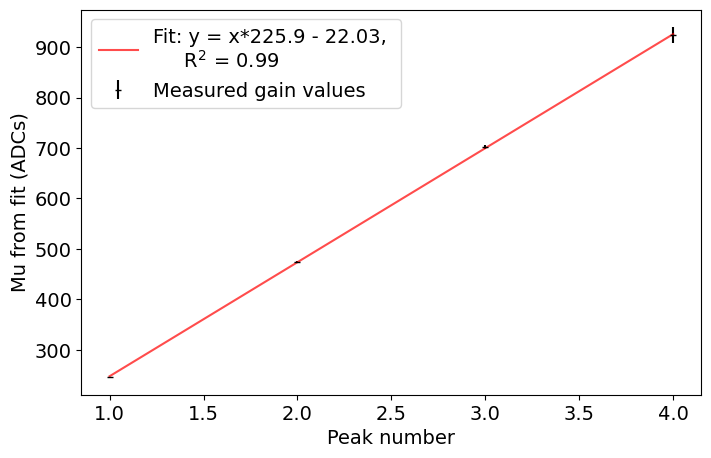

In [31]:
all_slopes = {}
for sel_date in peak_heights.keys():
    slope_ch = []
    for sel_channel in range(9):
        try:
            slope = fit_spectrum_and_plot(peak_heights[sel_date][sel_channel], channel=sel_channel, initial_guess=initial_guess_ch[sel_channel])
            slope_ch.append(slope)
        except RuntimeError:
            slope_ch.append(0)
            continue
            
    all_slopes[sel_date] = np.array(slope_ch)

In [32]:
all_slopes

{'11_20_2023': array([226.00663934, 206.7871513 , 221.07788724, 211.56947489,
        224.78729245, 227.41737901, 221.73063328, 226.28395664,
        220.30802631]),
 '11_21_2023': array([230.97569395, 225.15585498, 223.36360719, 215.21141872,
        220.49460324, 231.17601976, 227.217805  ,   0.        ,
        226.0781069 ]),
 '11_23_2023': array([230.32034941, 214.17800893, 221.06783585, 215.24951288,
        225.07826745, 230.73166673, 226.76031137, 231.94334623,
        225.98505799]),
 '11_24_2023': array([227.05100563, 219.72911985, 220.79585546, 215.74338185,
         29.52459434, 230.87567871, 227.01821184, 116.57874509,
        225.58343576]),
 '11_25_2023': array([230.71072546, -13.2945049 , 221.98183312, 215.2593647 ,
         29.84537099, 231.33320398, 226.91685095, 201.73206305,
        226.05064955]),
 '11_26_2023': array([228.27384626, 259.37445462, 222.9752576 , 215.76266783,
        229.66290754, 230.62339484, 226.95605248, 232.0107658 ,
        225.80356709]),
 '11

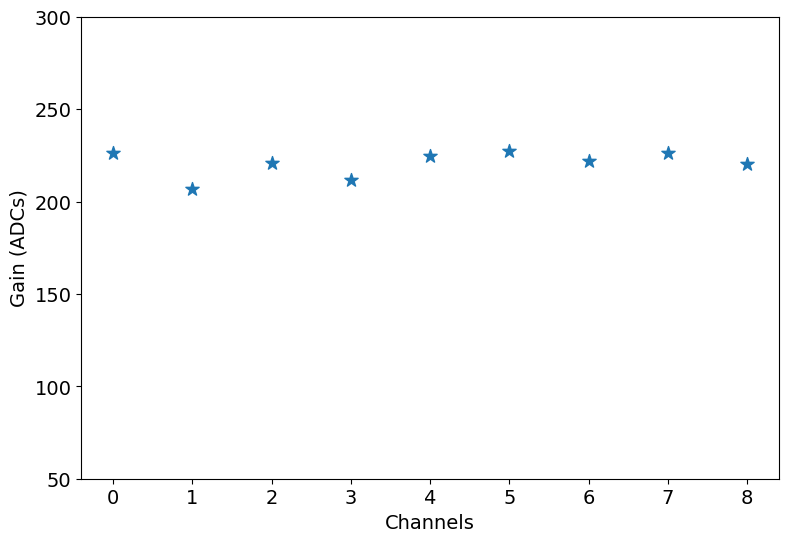

In [33]:
plt.scatter(range(9), all_slopes['11_20_2023'], marker='*', s=100)
plt.ylim(50, 300)
plt.xlabel('Channels')
plt.ylabel('Gain (ADC)')
plt.show()

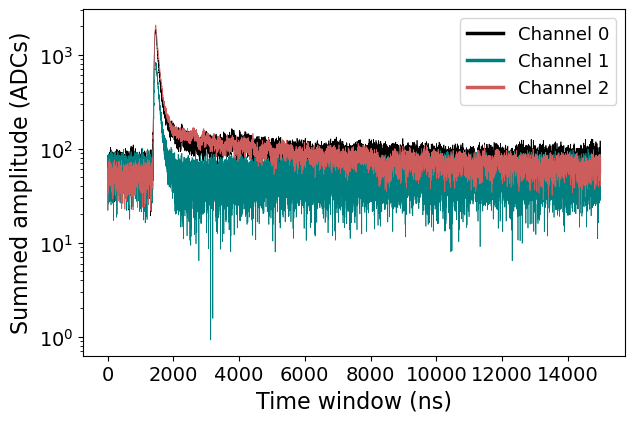

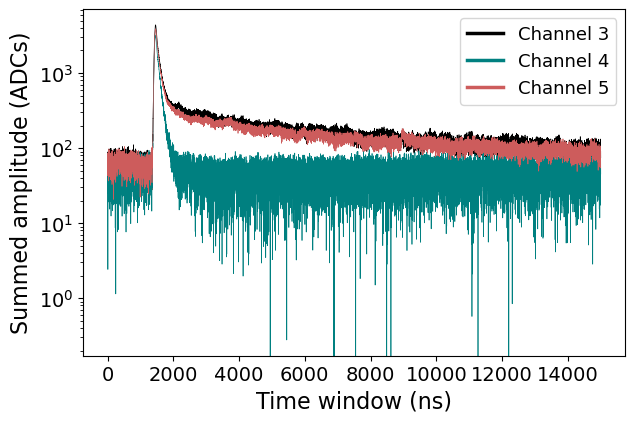

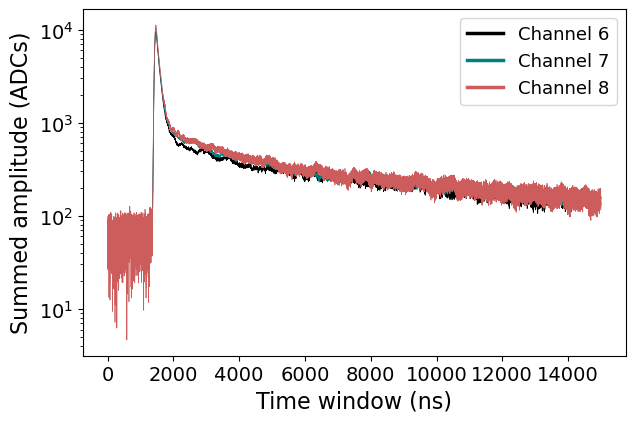

In [34]:
for ch_row in [[0, 1, 2], [3, 4, 5], [6, 7, 8]]:
    plt.figure(figsize=(7, 4.5))
    for channel, col in zip(ch_row, ['k', 'teal', 'indianred']):
        all_wfs = np.array(RawTree[f'chan{channel}/rdigi'].array())
        subt_wf = pf.subtract_baseline(all_wfs, mode=True, wf_range_bsl=(0, 500))
        sum_wf  = np.sum(subt_wf, axis=0)/all_slopes['11_20_2023'][channel]
        plt.plot(2*np.arange(len(sum_wf)), sum_wf, linewidth=0.5, label=f'Channel {channel}', color=col)
    plt.xlabel('Time window (ns)',        fontsize=16)
    plt.ylabel('Summed amplitude (ADC)', fontsize=16)
    plt.yscale('log')
    plt.legend()
    leg = plt.legend(ncol=1, fontsize=13)
    for line in leg.get_lines():
        line.set_linewidth(2.5)
    plt.show()

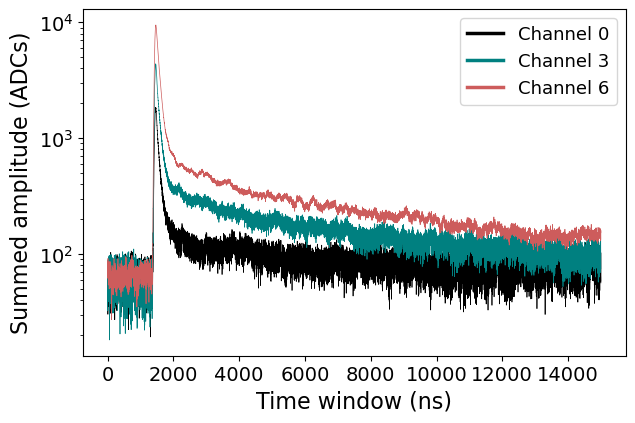

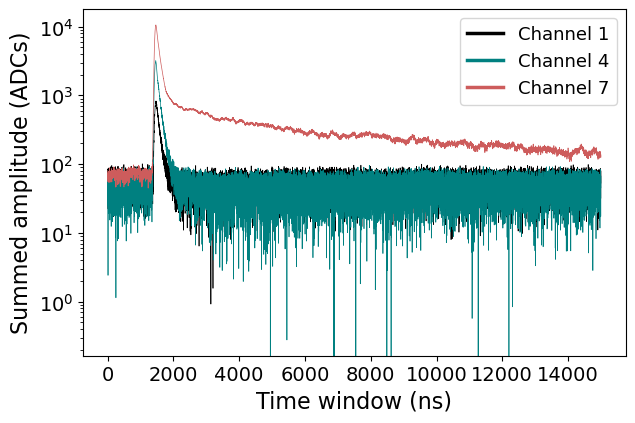

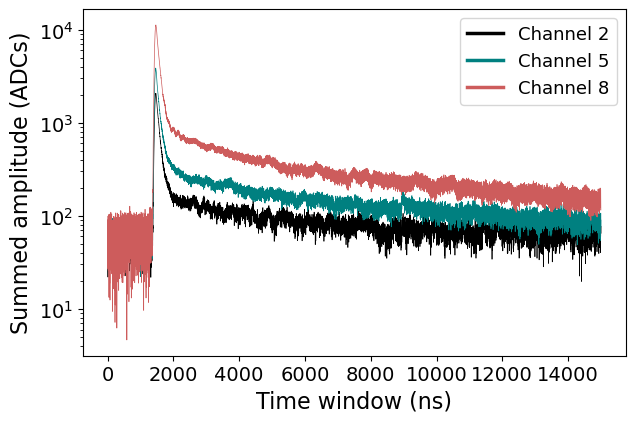

In [35]:
for ch_row in [[0, 3, 6], [1, 4, 7], [2, 5, 8]]:
    plt.figure(figsize=(7, 4.5))
    for channel, col in zip(ch_row, ['k', 'teal', 'indianred']):
        all_wfs = np.array(RawTree[f'chan{channel}/rdigi'].array())
        subt_wf = pf.subtract_baseline(all_wfs, mode=True, wf_range_bsl=(0, 500))
        sum_wf  = np.sum(subt_wf, axis=0)/all_slopes['11_20_2023'][channel]
        plt.plot(2*np.arange(len(sum_wf)), sum_wf, linewidth=0.5, label=f'Channel {channel}', color=col)
    plt.xlabel('Time window (ns)',        fontsize=16)
    plt.ylabel('Summed amplitude (ADC)', fontsize=16)
    plt.yscale('log')
    plt.legend()
    leg = plt.legend(ncol=1, fontsize=13)
    for line in leg.get_lines():
        line.set_linewidth(2.5)
    plt.show()

<Figure size 700x450 with 0 Axes>

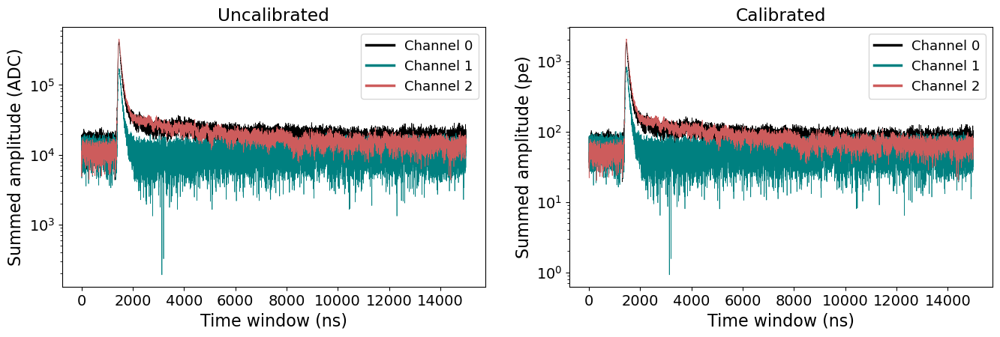

<Figure size 700x450 with 0 Axes>

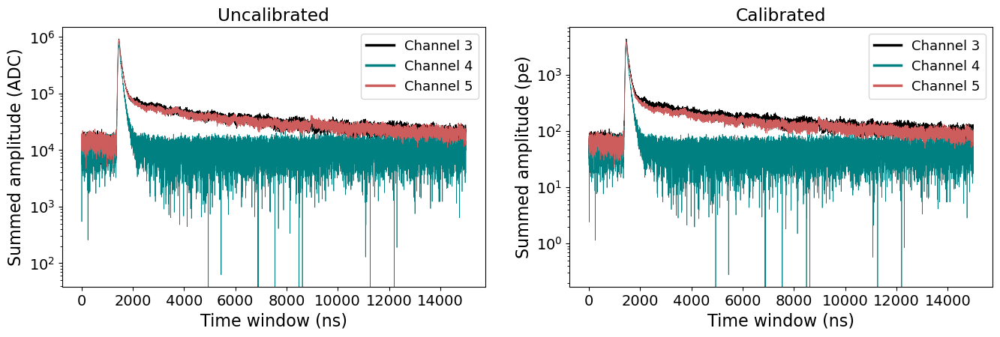

<Figure size 700x450 with 0 Axes>

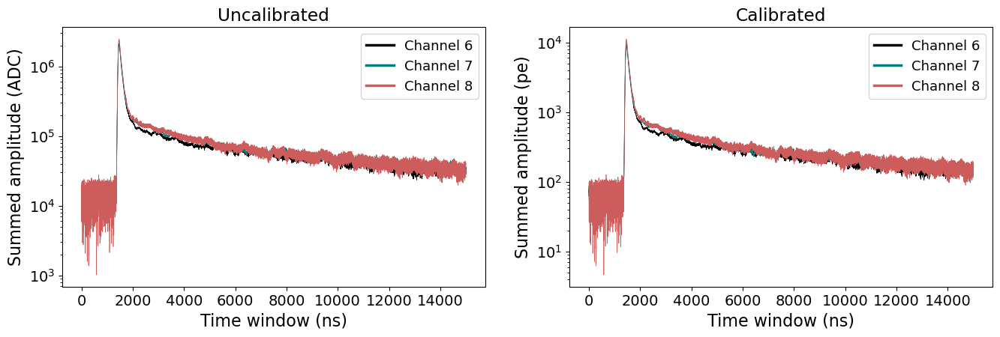

In [36]:
for ch_row in [[0, 1, 2], [3, 4, 5], [6, 7, 8]]:
    plt.figure(figsize=(7, 4.5))
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 4.5))
    for channel, col in zip(ch_row, ['k', 'teal', 'indianred']):
        all_wfs = np.array(RawTree[f'chan{channel}/rdigi'].array())
        subt_wf = pf.subtract_baseline(all_wfs, mode=True, wf_range_bsl=(0, 500))
        sum_wf  = np.sum(subt_wf, axis=0)
        ax1.plot(2*np.arange(len(sum_wf)), sum_wf, linewidth=0.5, label=f'Channel {channel}', color=col)
        ax2.plot(2*np.arange(len(sum_wf)), sum_wf/all_slopes['11_20_2023'][channel], linewidth=0.5, label=f'Channel {channel}', color=col)
    ax1.set_xlabel('Time window (ns)',        fontsize=16)
    ax1.set_ylabel('Summed amplitude (ADC)', fontsize=16)
    ax1.set_yscale('log')
    ax1.set_title('Uncalibrated')
    leg = ax1.legend(ncol=1, fontsize=13)
    for line in leg.get_lines():
        line.set_linewidth(2.5)
    ax2.set_xlabel('Time window (ns)',        fontsize=16)
    ax2.set_ylabel('Summed amplitude (pe)', fontsize=16)
    ax2.set_yscale('log')
    ax2.set_title('Calibrated')
    leg = ax2.legend(ncol=1, fontsize=13)
    for line in leg.get_lines():
        line.set_linewidth(2.5)
    plt.show()

In [37]:
gains_dark_box_vb55 = np.array([134.57801821, 133.68639542, 136.39412143, 138.11533159,
                                140.29249586, 136.46477923, 131.27390486, 127.56319275,
                                130.72306411, 139.4783214 , 142.0017588 , 165.5407446])
gains_dark_box_vb56 = np.array([174.03107833, 172.96599152, 176.42412688, 179.54566931,
                                179.21006561, 179.21814564, 177.77043258, 166.97475842,
                                173.60047227, 184.8525647 , 181.81694524, 186.04528817])

In [38]:
gains_BACoN = all_slopes['11_20_2023']

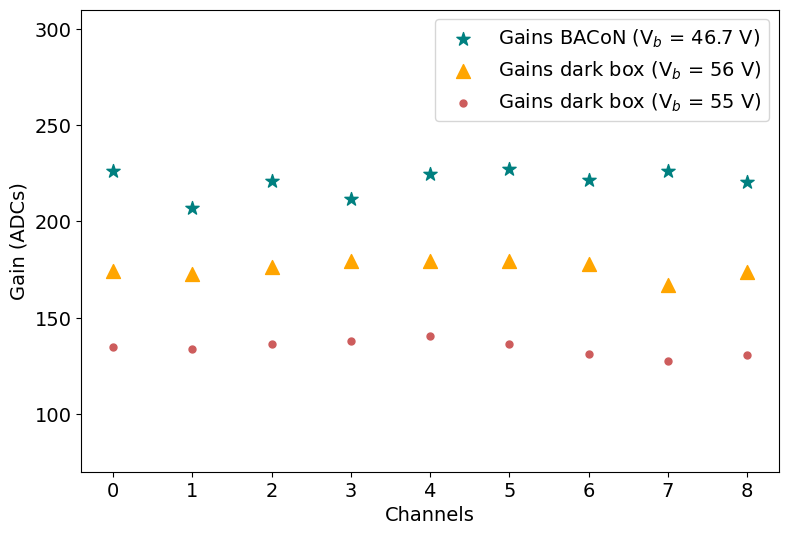

In [39]:
plt.scatter(range(9), gains_BACoN,             marker='*', s=100, label='Gains BACoN (V$_b$ = 46.7 V)' , color='teal')
plt.scatter(range(9), gains_dark_box_vb56[:9], marker='^', s=100, label='Gains dark box (V$_b$ = 56 V)', color='orange')
plt.scatter(range(9), gains_dark_box_vb55[:9], marker='.', s=100, label='Gains dark box (V$_b$ = 55 V)', color='indianred')
plt.ylim(70, 310)
plt.xlabel('Channels')
plt.ylabel('Gain (ADC)')
plt.legend()
plt.show()

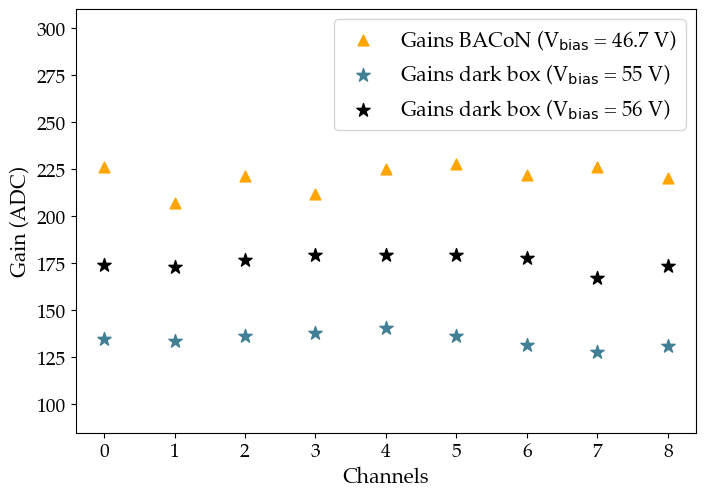

In [66]:
import matplotlib
# Set Palatino as the serif font
matplotlib.rcParams['font.family'] = 'serif'
matplotlib.rcParams['font.serif']  = 'Palatino'

plt.figure(figsize=(8, 5.5))
plt.scatter(range(9), gains_BACoN,             marker='^', s=60,  label='Gains BACoN (V$_{\mathrm{bias}}$ = 46.7 V)' , color='orange')
plt.scatter(range(9), gains_dark_box_vb55[:9], marker='*', s=100, label='Gains dark box (V$_{\mathrm{bias}}$ = 55 V)', color=fav_col)
plt.scatter(range(9), gains_dark_box_vb56[:9], marker='*', s=100, label='Gains dark box (V$_{\mathrm{bias}}$ = 56 V)', color='k')
plt.ylim(85, 310)
plt.xlabel('Channels'   , fontsize=15)
plt.ylabel('Gain (ADC)', fontsize=15)
plt.legend(fontsize=15)
#plt.savefig('/Users/romoluque_c/LEGEND/BACON/Analysis_documentation/images/gains_dark_box_and_BACoN.pdf', bbox_inches='tight')
plt.show()

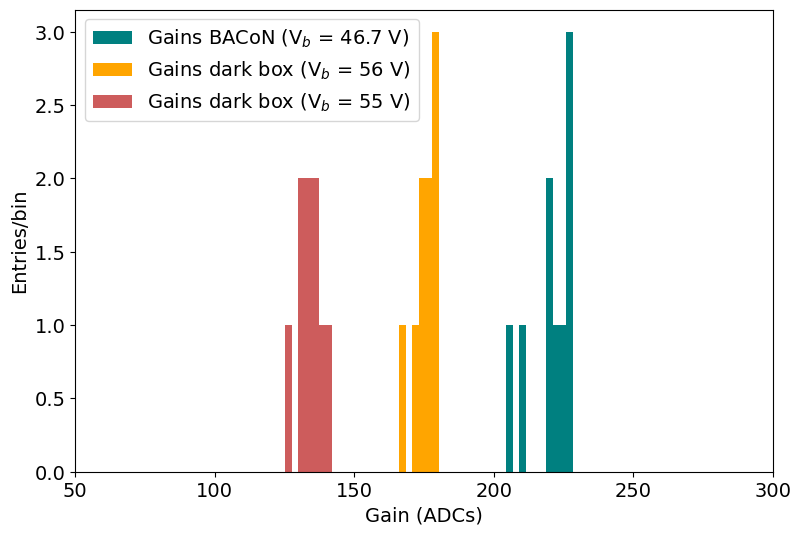

In [41]:
plt.hist(gains_BACoN,             bins=100, range=(70, 310), label='Gains BACoN (V$_b$ = 46.7 V)' , color='teal')
plt.hist(gains_dark_box_vb56[:9], bins=100, range=(70, 310), label='Gains dark box (V$_b$ = 56 V)', color='orange')
plt.hist(gains_dark_box_vb55[:9], bins=100, range=(70, 310), label='Gains dark box (V$_b$ = 55 V)', color='indianred')
plt.xlim(50, 300)
plt.xlabel('Gain (ADC)')
plt.ylabel('Entries/bin')
plt.legend(loc=2)
plt.show()

In [658]:
gains_BACoN

array([226.00663934, 206.7871513 , 221.07788724, 211.56947489,
       224.78729245, 227.41737901, 221.73063328, 226.28395664,
       220.30802631])